In [1]:
import pandas as pd 
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from sklearn.impute import SimpleImputer
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)
from sklearn.metrics import mean_absolute_percentage_error as mape
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima.model import ARIMA

In [2]:
df = pd.read_csv('train_1.csv')

In [3]:
df.shape

(145063, 551)

# NAN Values

In [4]:
df.isna().sum()

Page              0
2015-07-01    20740
2015-07-02    20816
2015-07-03    20544
2015-07-04    20654
2015-07-05    20659
2015-07-06    20483
2015-07-07    20664
2015-07-08    20294
2015-07-09    20244
2015-07-10    20342
2015-07-11    20525
2015-07-12    20485
2015-07-13    20399
2015-07-14    20140
2015-07-15    20106
2015-07-16    19987
2015-07-17    20048
2015-07-18    20295
2015-07-19    20142
2015-07-20    19979
2015-07-21    19688
2015-07-22    19573
2015-07-23    19581
2015-07-24    19593
2015-07-25    19589
2015-07-26    19865
2015-07-27    19759
2015-07-28    19553
2015-07-29    19347
2015-07-30    19592
2015-07-31    19708
2015-08-01    19640
2015-08-02    19844
2015-08-03    19842
2015-08-04    19595
2015-08-05    19607
2015-08-06    19424
2015-08-07    19528
2015-08-08    19525
2015-08-09    19320
2015-08-10    19370
2015-08-11    19385
2015-08-12    19507
2015-08-13    19317
2015-08-14    19272
2015-08-15    19320
2015-08-16    19213
2015-08-17    18954
2015-08-18    19104


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145063 entries, 0 to 145062
Columns: 551 entries, Page to 2016-12-31
dtypes: float64(550), object(1)
memory usage: 609.8+ MB


In [6]:
exog = pd.read_csv('Exog_Campaign_eng.csv')

In [7]:
exog.shape

(550, 1)

In [8]:
df.head(10)

,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,2015-07-11,2015-07-12,2015-07-13,2015-07-14,2015-07-15,2015-07-16,2015-07-17,2015-07-18,2015-07-19,2015-07-20,2015-07-21,2015-07-22,2015-07-23,2015-07-24,2015-07-25,2015-07-26,2015-07-27,2015-07-28,2015-07-29,2015-07-30,2015-07-31,2015-08-01,2015-08-02,2015-08-03,2015-08-04,2015-08-05,2015-08-06,2015-08-07,2015-08-08,2015-08-09,2015-08-10,2015-08-11,2015-08-12,2015-08-13,2015-08-14,2015-08-15,2015-08-16,2015-08-17,2015-08-18,2015-08-19,2015-08-20,2015-08-21,2015-08-22,2015-08-23,2015-08-24,2015-08-25,2015-08-26,2015-08-27,2015-08-28,2015-08-29,2015-08-30,2015-08-31,2015-09-01,2015-09-02,2015-09-03,2015-09-04,2015-09-05,2015-09-06,2015-09-07,2015-09-08,2015-09-09,2015-09-10,2015-09-11,2015-09-12,2015-09-13,2015-09-14,2015-09-15,2015-09-16,2015-09-17,2015-09-18,2015-09-19,2015-09-20,2015-09-21,2015-09-22,2015-09-23,2015-09-24,2015-09-25,2015-09-26,2015-09-27,2015-09-28,2015-09-29,2015-09-30,2015-10-01,2015-10-02,2015-10-03,2015-10-04,2015-10-05,2015-10-06,2015-10-07,2015-10-08,2015-10-09,2015-10-10,2015-10-11,2015-10-12,2015-10-13,2015-10-14,2015-10-15,2015-10-16,2015-10-17,2015-10-18,2015-10-19,2015-10-20,2015-10-21,2015-10-22,2015-10-23,2015-10-24,2015-10-25,2015-10-26,2015-10-27,2015-10-28,2015-10-29,2015-10-30,2015-10-31,2015-11-01,2015-11-02,2015-11-03,2015-11-04,2015-11-05,2015-11-06,2015-11-07,2015-11-08,2015-11-09,2015-11-10,2015-11-11,2015-11-12,2015-11-13,2015-11-14,2015-11-15,2015-11-16,2015-11-17,2015-11-18,2015-11-19,2015-11-20,2015-11-21,2015-11-22,2015-11-23,2015-11-24,2015-11-25,2015-11-26,2015-11-27,2015-11-28,2015-11-29,2015-11-30,2015-12-01,2015-12-02,2015-12-03,2015-12-04,2015-12-05,2015-12-06,2015-12-07,2015-12-08,2015-12-09,2015-12-10,2015-12-11,2015-12-12,2015-12-13,2015-12-14,2015-12-15,2015-12-16,2015-12-17,2015-12-18,2015-12-19,2015-12-20,2015-12-21,2015-12-22,2015-12-23,2015-12-24,2015-12-25,2015-12-26,2015-12-27,2015-12-28,2015-12-29,2015-12-30,2015-12-31,2016-01-01,2016-01-02,2016-01-03,2016-01-04,2016-01-05,2016-01-06,2016-01-07,2016-01-08,2016-01-09,2016-01-10,2016-01-11,2016-01-12,2016-01-13,2016-01-14,2016-01-15,2016-01-16,2016-01-17,2016-01-18,2016-01-19,2016-01-20,2016-01-21,2016-01-22,2016-01-23,2016-01-24,2016-01-25,2016-01-26,2016-01-27,2016-01-28,2016-01-29,2016-01-30,2016-01-31,2016-02-01,2016-02-02,2016-02-03,2016-02-04,2016-02-05,2016-02-06,2016-02-07,2016-02-08,2016-02-09,2016-02-10,2016-02-11,2016-02-12,2016-02-13,2016-02-14,2016-02-15,2016-02-16,2016-02-17,2016-02-18,2016-02-19,2016-02-20,2016-02-21,2016-02-22,2016-02-23,2016-02-24,2016-02-25,2016-02-26,2016-02-27,2016-02-28,2016-02-29,2016-03-01,2016-03-02,2016-03-03,2016-03-04,2016-03-05,2016-03-06,2016-03-07,2016-03-08,2016-03-09,2016-03-10,2016-03-11,2016-03-12,2016-03-13,2016-03-14,2016-03-15,2016-03-16,2016-03-17,2016-03-18,2016-03-19,2016-03-20,2016-03-21,2016-03-22,2016-03-23,2016-03-24,2016-03-25,2016-03-26,2016-03-27,2016-03-28,2016-03-29,2016-03-30,2016-03-31,2016-04-01,2016-04-02,2016-04-03,2016-04-04,2016-04-05,2016-04-06,2016-04-07,2016-04-08,2016-04-09,2016-04-10,2016-04-11,2016-04-12,2016-04-13,2016-04-14,2016-04-15,2016-04-16,2016-04-17,2016-04-18,2016-04-19,2016-04-20,2016-04-21,2016-04-22,2016-04-23,2016-04-24,2016-04-25,2016-04-26,2016-04-27,2016-04-28,2016-04-29,2016-04-30,2016-05-01,2016-05-02,2016-05-03,2016-05-04,2016-05-05,2016-05-06,2016-05-07,2016-05-08,2016-05-09,2016-05-10,2016-05-11,2016-05-12,2016-05-13,2016-05-14,2016-05-15,2016-05-16,2016-05-17,2016-05-18,2016-05-19,2016-05-20,2016-05-21,2016-05-22,2016-05-23,2016-05-24,2016-05-25,2016-05-26,2016-05-27,2016-05-28,2016-05-29,2016-05-30,2016-05-31,2016-06-01,2016-06-02,2016-06-03,2016-06-04,2016-06-05,2016-06-06,2016-06-07,2016-06-08,2016-06-09,2016-06-10,2016-06-11,2016-06-12,2016-06-13,2016-06-14,2016-06-15,2016-06-16,2016-06-17,2016-06-18,2016-06-19,2016-06-20,2016-06-21,2016-06-22,2016-06-23,2016-06-24,2016-06-25,2016-06-26,2016-06-27,2

In [9]:
# The page name contains data in this format:

# SPECIFIC NAME _ LANGUAGE.wikipedia.org _ ACCESS TYPE _ ACCESS ORIGIN

In [10]:
import re
# lang_list.extend([string for string in val if re.search(pattern, string)])
def get_language_list(values):
    ans = []
    pattern = r'_(\w{2,3})\.wikipedia\.org'
    for val in values:
        match = re.search(pattern, val)
        if match:
            language_code = match.group(1)
            ans.append(language_code)  # Output: zh
        else:
            ans.append("NA")
    return ans

In [11]:
df['language_code'] = get_language_list(df['Page'])

In [12]:
df['Page'] = df['language_code']

In [13]:
df.rename({'Page':'Language'},axis=1,inplace=True)

In [14]:
df.drop('language_code',axis=1,inplace=True)

In [15]:
Exo_lang = df['Language']

In [16]:
df = df.loc[:,'2015-07-01':'2016-12-31']

# Data Processing 

In [17]:
(df.tail(20))

,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,2015-07-11,2015-07-12,2015-07-13,2015-07-14,2015-07-15,2015-07-16,2015-07-17,2015-07-18,2015-07-19,2015-07-20,2015-07-21,2015-07-22,2015-07-23,2015-07-24,2015-07-25,2015-07-26,2015-07-27,2015-07-28,2015-07-29,2015-07-30,2015-07-31,2015-08-01,2015-08-02,2015-08-03,2015-08-04,2015-08-05,2015-08-06,2015-08-07,2015-08-08,2015-08-09,2015-08-10,2015-08-11,2015-08-12,2015-08-13,2015-08-14,2015-08-15,2015-08-16,2015-08-17,2015-08-18,2015-08-19,2015-08-20,2015-08-21,2015-08-22,2015-08-23,2015-08-24,2015-08-25,2015-08-26,2015-08-27,2015-08-28,2015-08-29,2015-08-30,2015-08-31,2015-09-01,2015-09-02,2015-09-03,2015-09-04,2015-09-05,2015-09-06,2015-09-07,2015-09-08,2015-09-09,2015-09-10,2015-09-11,2015-09-12,2015-09-13,2015-09-14,2015-09-15,2015-09-16,2015-09-17,2015-09-18,2015-09-19,2015-09-20,2015-09-21,2015-09-22,2015-09-23,2015-09-24,2015-09-25,2015-09-26,2015-09-27,2015-09-28,2015-09-29,2015-09-30,2015-10-01,2015-10-02,2015-10-03,2015-10-04,2015-10-05,2015-10-06,2015-10-07,2015-10-08,2015-10-09,2015-10-10,2015-10-11,2015-10-12,2015-10-13,2015-10-14,2015-10-15,2015-10-16,2015-10-17,2015-10-18,2015-10-19,2015-10-20,2015-10-21,2015-10-22,2015-10-23,2015-10-24,2015-10-25,2015-10-26,2015-10-27,2015-10-28,2015-10-29,2015-10-30,2015-10-31,2015-11-01,2015-11-02,2015-11-03,2015-11-04,2015-11-05,2015-11-06,2015-11-07,2015-11-08,2015-11-09,2015-11-10,2015-11-11,2015-11-12,2015-11-13,2015-11-14,2015-11-15,2015-11-16,2015-11-17,2015-11-18,2015-11-19,2015-11-20,2015-11-21,2015-11-22,2015-11-23,2015-11-24,2015-11-25,2015-11-26,2015-11-27,2015-11-28,2015-11-29,2015-11-30,2015-12-01,2015-12-02,2015-12-03,2015-12-04,2015-12-05,2015-12-06,2015-12-07,2015-12-08,2015-12-09,2015-12-10,2015-12-11,2015-12-12,2015-12-13,2015-12-14,2015-12-15,2015-12-16,2015-12-17,2015-12-18,2015-12-19,2015-12-20,2015-12-21,2015-12-22,2015-12-23,2015-12-24,2015-12-25,2015-12-26,2015-12-27,2015-12-28,2015-12-29,2015-12-30,2015-12-31,2016-01-01,2016-01-02,2016-01-03,2016-01-04,2016-01-05,2016-01-06,2016-01-07,2016-01-08,2016-01-09,2016-01-10,2016-01-11,2016-01-12,2016-01-13,2016-01-14,2016-01-15,2016-01-16,2016-01-17,2016-01-18,2016-01-19,2016-01-20,2016-01-21,2016-01-22,2016-01-23,2016-01-24,2016-01-25,2016-01-26,2016-01-27,2016-01-28,2016-01-29,2016-01-30,2016-01-31,2016-02-01,2016-02-02,2016-02-03,2016-02-04,2016-02-05,2016-02-06,2016-02-07,2016-02-08,2016-02-09,2016-02-10,2016-02-11,2016-02-12,2016-02-13,2016-02-14,2016-02-15,2016-02-16,2016-02-17,2016-02-18,2016-02-19,2016-02-20,2016-02-21,2016-02-22,2016-02-23,2016-02-24,2016-02-25,2016-02-26,2016-02-27,2016-02-28,2016-02-29,2016-03-01,2016-03-02,2016-03-03,2016-03-04,2016-03-05,2016-03-06,2016-03-07,2016-03-08,2016-03-09,2016-03-10,2016-03-11,2016-03-12,2016-03-13,2016-03-14,2016-03-15,2016-03-16,2016-03-17,2016-03-18,2016-03-19,2016-03-20,2016-03-21,2016-03-22,2016-03-23,2016-03-24,2016-03-25,2016-03-26,2016-03-27,2016-03-28,2016-03-29,2016-03-30,2016-03-31,2016-04-01,2016-04-02,2016-04-03,2016-04-04,2016-04-05,2016-04-06,2016-04-07,2016-04-08,2016-04-09,2016-04-10,2016-04-11,2016-04-12,2016-04-13,2016-04-14,2016-04-15,2016-04-16,2016-04-17,2016-04-18,2016-04-19,2016-04-20,2016-04-21,2016-04-22,2016-04-23,2016-04-24,2016-04-25,2016-04-26,2016-04-27,2016-04-28,2016-04-29,2016-04-30,2016-05-01,2016-05-02,2016-05-03,2016-05-04,2016-05-05,2016-05-06,2016-05-07,2016-05-08,2016-05-09,2016-05-10,2016-05-11,2016-05-12,2016-05-13,2016-05-14,2016-05-15,2016-05-16,2016-05-17,2016-05-18,2016-05-19,2016-05-20,2016-05-21,2016-05-22,2016-05-23,2016-05-24,2016-05-25,2016-05-26,2016-05-27,2016-05-28,2016-05-29,2016-05-30,2016-05-31,2016-06-01,2016-06-02,2016-06-03,2016-06-04,2016-06-05,2016-06-06,2016-06-07,2016-06-08,2016-06-09,2016-06-10,2016-06-11,2016-06-12,2016-06-13,2016-06-14,2016-06-15,2016-06-16,2016-06-17,2016-06-18,2016-06-19,2016-06-20,2016-06-21,2016-06-22,2016-06-23,2016-06-24,2016-06-25,2016-06-26,2016-06-27,2016-0

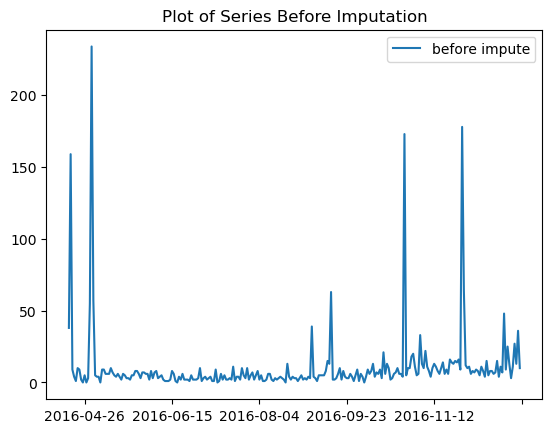

In [18]:
plt.title('Plot of Series Before Imputation')
df.iloc[4].plot(label='before impute')
plt.legend()
plt.show()

In [19]:
np.all(df.loc[145062].isna())

True

`Approach`
1. Check Whether all Values are NAN.

2. If all values are NAN the Flag those row as 'Y' else 'N'

In [20]:
def flag_all_nan_rows(df):
    ans = []
    for i in range(df.shape[0]):
        if(np.all(df.loc[i].isna())==True):
            ans.append('Y')
        else:
            ans.append('N')
    return ans
df['Nan Flag'] = flag_all_nan_rows(df)

# Filtering all rows which is not having NAN Values.

In [21]:
df['Language'] = Exo_lang

In [22]:
df = df[df['Nan Flag']=='N'].reset_index()

In [23]:
exolang = df['Language']

In [24]:
df.drop(['Language','Nan Flag','index'],axis=1,inplace=True)

# New Shape of Data

In [25]:
df.shape

(144411, 550)

`Approach`

Filling all row NAN values with the median values because each row is independent of each other

In [26]:
def fill_na_imputation(df):
    for i in range(df.shape[0]):
        df.loc[i].fillna(df.loc[i].median(),inplace=True)
    return df

In [27]:
df = fill_na_imputation(df)

# NAN Values are fixed now

In [28]:
df.isna().sum()

2015-07-01    0
2015-07-02    0
2015-07-03    0
2015-07-04    0
2015-07-05    0
2015-07-06    0
2015-07-07    0
2015-07-08    0
2015-07-09    0
2015-07-10    0
2015-07-11    0
2015-07-12    0
2015-07-13    0
2015-07-14    0
2015-07-15    0
2015-07-16    0
2015-07-17    0
2015-07-18    0
2015-07-19    0
2015-07-20    0
2015-07-21    0
2015-07-22    0
2015-07-23    0
2015-07-24    0
2015-07-25    0
2015-07-26    0
2015-07-27    0
2015-07-28    0
2015-07-29    0
2015-07-30    0
2015-07-31    0
2015-08-01    0
2015-08-02    0
2015-08-03    0
2015-08-04    0
2015-08-05    0
2015-08-06    0
2015-08-07    0
2015-08-08    0
2015-08-09    0
2015-08-10    0
2015-08-11    0
2015-08-12    0
2015-08-13    0
2015-08-14    0
2015-08-15    0
2015-08-16    0
2015-08-17    0
2015-08-18    0
2015-08-19    0
2015-08-20    0
2015-08-21    0
2015-08-22    0
2015-08-23    0
2015-08-24    0
2015-08-25    0
2015-08-26    0
2015-08-27    0
2015-08-28    0
2015-08-29    0
2015-08-30    0
2015-08-31    0
2015-09-

# Data Frame after imputation

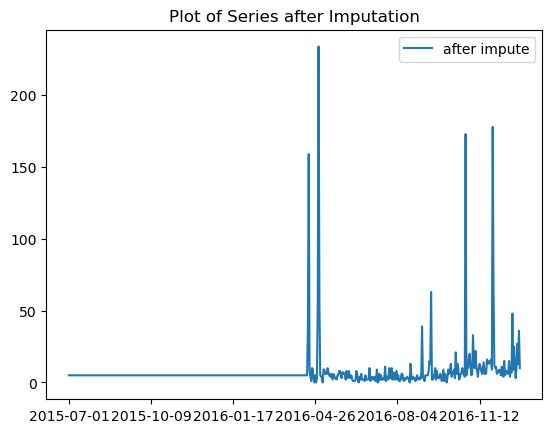

In [29]:
plt.title('Plot of Series after Imputation')
df.iloc[4].plot(label= 'after impute')
plt.legend()
plt.show()

In [30]:
set(exolang)

{'NA', '_de', 'de', 'en', 'es', 'fr', 'ja', 'ru', 'zh'}

# EDA On the basis of Trend of language

In [31]:
df_language = pd.DataFrame(exolang.value_counts().reset_index())

In [32]:
df_language

,index,Language
0,en,24010
1,ja,20340
2,de,18437
3,fr,17761
4,NA,17728
5,zh,17103
6,ru,14990
7,es,14041
8,_de,1


# Full form of all language code
_de: German (This is typically used as a locale specifier, e.g., for formatting purposes.)

de: German

en: English

es: Spanish

fr: French

ja: Japanese

ru: Russian

zh: Chinese

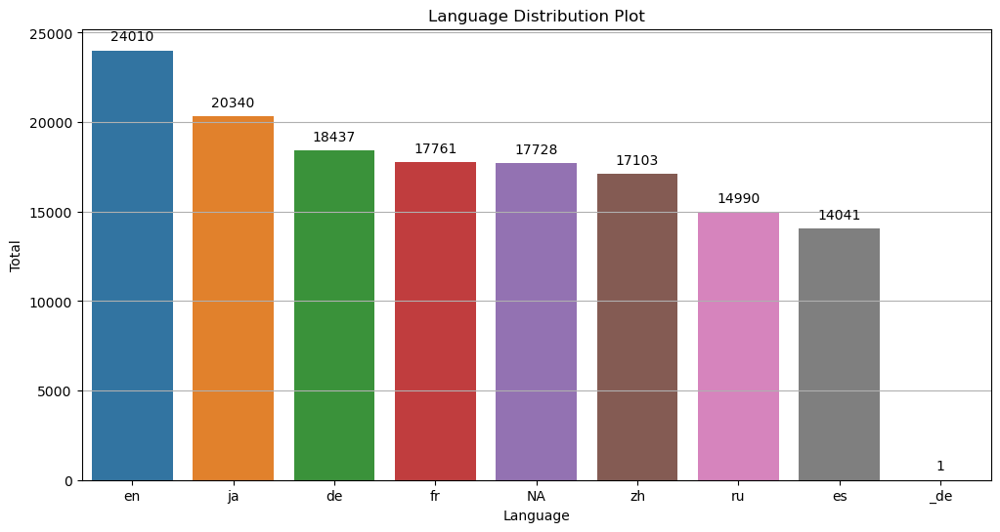

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns

# Your dataframe
# df_language = ...
plt.figure(figsize=(12,6))
plt.grid()
plt.title('Language Distribution Plot')

# Create the bar plot
ax = sns.barplot(x=df_language['index'], y=df_language['Language'])

# Annotate each bar with its value
for p in ax.patches:
    ax.annotate(f"{p.get_height():.0f}", 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', 
                va='center', 
                xytext=(0, 10), 
                textcoords='offset points')

plt.xlabel('Language')
plt.ylabel('Total')
plt.show()


# Observation 
1. Pages with english is more as compare to other.
2. Pages with Spanish is less.

In [34]:
df['language'] = exolang

# Converting data to its General Form

In [35]:
df.head()

,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,2015-07-11,2015-07-12,2015-07-13,2015-07-14,2015-07-15,2015-07-16,2015-07-17,2015-07-18,2015-07-19,2015-07-20,2015-07-21,2015-07-22,2015-07-23,2015-07-24,2015-07-25,2015-07-26,2015-07-27,2015-07-28,2015-07-29,2015-07-30,2015-07-31,2015-08-01,2015-08-02,2015-08-03,2015-08-04,2015-08-05,2015-08-06,2015-08-07,2015-08-08,2015-08-09,2015-08-10,2015-08-11,2015-08-12,2015-08-13,2015-08-14,2015-08-15,2015-08-16,2015-08-17,2015-08-18,2015-08-19,2015-08-20,2015-08-21,2015-08-22,2015-08-23,2015-08-24,2015-08-25,2015-08-26,2015-08-27,2015-08-28,2015-08-29,2015-08-30,2015-08-31,2015-09-01,2015-09-02,2015-09-03,2015-09-04,2015-09-05,2015-09-06,2015-09-07,2015-09-08,2015-09-09,2015-09-10,2015-09-11,2015-09-12,2015-09-13,2015-09-14,2015-09-15,2015-09-16,2015-09-17,2015-09-18,2015-09-19,2015-09-20,2015-09-21,2015-09-22,2015-09-23,2015-09-24,2015-09-25,2015-09-26,2015-09-27,2015-09-28,2015-09-29,2015-09-30,2015-10-01,2015-10-02,2015-10-03,2015-10-04,2015-10-05,2015-10-06,2015-10-07,2015-10-08,2015-10-09,2015-10-10,2015-10-11,2015-10-12,2015-10-13,2015-10-14,2015-10-15,2015-10-16,2015-10-17,2015-10-18,2015-10-19,2015-10-20,2015-10-21,2015-10-22,2015-10-23,2015-10-24,2015-10-25,2015-10-26,2015-10-27,2015-10-28,2015-10-29,2015-10-30,2015-10-31,2015-11-01,2015-11-02,2015-11-03,2015-11-04,2015-11-05,2015-11-06,2015-11-07,2015-11-08,2015-11-09,2015-11-10,2015-11-11,2015-11-12,2015-11-13,2015-11-14,2015-11-15,2015-11-16,2015-11-17,2015-11-18,2015-11-19,2015-11-20,2015-11-21,2015-11-22,2015-11-23,2015-11-24,2015-11-25,2015-11-26,2015-11-27,2015-11-28,2015-11-29,2015-11-30,2015-12-01,2015-12-02,2015-12-03,2015-12-04,2015-12-05,2015-12-06,2015-12-07,2015-12-08,2015-12-09,2015-12-10,2015-12-11,2015-12-12,2015-12-13,2015-12-14,2015-12-15,2015-12-16,2015-12-17,2015-12-18,2015-12-19,2015-12-20,2015-12-21,2015-12-22,2015-12-23,2015-12-24,2015-12-25,2015-12-26,2015-12-27,2015-12-28,2015-12-29,2015-12-30,2015-12-31,2016-01-01,2016-01-02,2016-01-03,2016-01-04,2016-01-05,2016-01-06,2016-01-07,2016-01-08,2016-01-09,2016-01-10,2016-01-11,2016-01-12,2016-01-13,2016-01-14,2016-01-15,2016-01-16,2016-01-17,2016-01-18,2016-01-19,2016-01-20,2016-01-21,2016-01-22,2016-01-23,2016-01-24,2016-01-25,2016-01-26,2016-01-27,2016-01-28,2016-01-29,2016-01-30,2016-01-31,2016-02-01,2016-02-02,2016-02-03,2016-02-04,2016-02-05,2016-02-06,2016-02-07,2016-02-08,2016-02-09,2016-02-10,2016-02-11,2016-02-12,2016-02-13,2016-02-14,2016-02-15,2016-02-16,2016-02-17,2016-02-18,2016-02-19,2016-02-20,2016-02-21,2016-02-22,2016-02-23,2016-02-24,2016-02-25,2016-02-26,2016-02-27,2016-02-28,2016-02-29,2016-03-01,2016-03-02,2016-03-03,2016-03-04,2016-03-05,2016-03-06,2016-03-07,2016-03-08,2016-03-09,2016-03-10,2016-03-11,2016-03-12,2016-03-13,2016-03-14,2016-03-15,2016-03-16,2016-03-17,2016-03-18,2016-03-19,2016-03-20,2016-03-21,2016-03-22,2016-03-23,2016-03-24,2016-03-25,2016-03-26,2016-03-27,2016-03-28,2016-03-29,2016-03-30,2016-03-31,2016-04-01,2016-04-02,2016-04-03,2016-04-04,2016-04-05,2016-04-06,2016-04-07,2016-04-08,2016-04-09,2016-04-10,2016-04-11,2016-04-12,2016-04-13,2016-04-14,2016-04-15,2016-04-16,2016-04-17,2016-04-18,2016-04-19,2016-04-20,2016-04-21,2016-04-22,2016-04-23,2016-04-24,2016-04-25,2016-04-26,2016-04-27,2016-04-28,2016-04-29,2016-04-30,2016-05-01,2016-05-02,2016-05-03,2016-05-04,2016-05-05,2016-05-06,2016-05-07,2016-05-08,2016-05-09,2016-05-10,2016-05-11,2016-05-12,2016-05-13,2016-05-14,2016-05-15,2016-05-16,2016-05-17,2016-05-18,2016-05-19,2016-05-20,2016-05-21,2016-05-22,2016-05-23,2016-05-24,2016-05-25,2016-05-26,2016-05-27,2016-05-28,2016-05-29,2016-05-30,2016-05-31,2016-06-01,2016-06-02,2016-06-03,2016-06-04,2016-06-05,2016-06-06,2016-06-07,2016-06-08,2016-06-09,2016-06-10,2016-06-11,2016-06-12,2016-06-13,2016-06-14,2016-06-15,2016-06-16,2016-06-17,2016-06-18,2016-06-19,2016-06-20,2016-06-21,2016-06-22,2016-06-23,2016-06-24,2016-06-25,2016-06-26,2016-06-27,2016-0

In [36]:
set(df['language'])

{'NA', '_de', 'de', 'en', 'es', 'fr', 'ja', 'ru', 'zh'}

In [37]:
en_df = df.loc[(df['language']=='en')==True]

In [38]:
mean_val_df =  df.pivot_table(index='language', aggfunc='mean')

In [39]:
mean_val_df.head()

,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,2015-07-11,2015-07-12,2015-07-13,2015-07-14,2015-07-15,2015-07-16,2015-07-17,2015-07-18,2015-07-19,2015-07-20,2015-07-21,2015-07-22,2015-07-23,2015-07-24,2015-07-25,2015-07-26,2015-07-27,2015-07-28,2015-07-29,2015-07-30,2015-07-31,2015-08-01,2015-08-02,2015-08-03,2015-08-04,2015-08-05,2015-08-06,2015-08-07,2015-08-08,2015-08-09,2015-08-10,2015-08-11,2015-08-12,2015-08-13,2015-08-14,2015-08-15,2015-08-16,2015-08-17,2015-08-18,2015-08-19,2015-08-20,2015-08-21,2015-08-22,2015-08-23,2015-08-24,2015-08-25,2015-08-26,2015-08-27,2015-08-28,2015-08-29,2015-08-30,2015-08-31,2015-09-01,2015-09-02,2015-09-03,2015-09-04,2015-09-05,2015-09-06,2015-09-07,2015-09-08,2015-09-09,2015-09-10,2015-09-11,2015-09-12,2015-09-13,2015-09-14,2015-09-15,2015-09-16,2015-09-17,2015-09-18,2015-09-19,2015-09-20,2015-09-21,2015-09-22,2015-09-23,2015-09-24,2015-09-25,2015-09-26,2015-09-27,2015-09-28,2015-09-29,2015-09-30,2015-10-01,2015-10-02,2015-10-03,2015-10-04,2015-10-05,2015-10-06,2015-10-07,2015-10-08,2015-10-09,2015-10-10,2015-10-11,2015-10-12,2015-10-13,2015-10-14,2015-10-15,2015-10-16,2015-10-17,2015-10-18,2015-10-19,2015-10-20,2015-10-21,2015-10-22,2015-10-23,2015-10-24,2015-10-25,2015-10-26,2015-10-27,2015-10-28,2015-10-29,2015-10-30,2015-10-31,2015-11-01,2015-11-02,2015-11-03,2015-11-04,2015-11-05,2015-11-06,2015-11-07,2015-11-08,2015-11-09,2015-11-10,2015-11-11,2015-11-12,2015-11-13,2015-11-14,2015-11-15,2015-11-16,2015-11-17,2015-11-18,2015-11-19,2015-11-20,2015-11-21,2015-11-22,2015-11-23,2015-11-24,2015-11-25,2015-11-26,2015-11-27,2015-11-28,2015-11-29,2015-11-30,2015-12-01,2015-12-02,2015-12-03,2015-12-04,2015-12-05,2015-12-06,2015-12-07,2015-12-08,2015-12-09,2015-12-10,2015-12-11,2015-12-12,2015-12-13,2015-12-14,2015-12-15,2015-12-16,2015-12-17,2015-12-18,2015-12-19,2015-12-20,2015-12-21,2015-12-22,2015-12-23,2015-12-24,2015-12-25,2015-12-26,2015-12-27,2015-12-28,2015-12-29,2015-12-30,2015-12-31,2016-01-01,2016-01-02,2016-01-03,2016-01-04,2016-01-05,2016-01-06,2016-01-07,2016-01-08,2016-01-09,2016-01-10,2016-01-11,2016-01-12,2016-01-13,2016-01-14,2016-01-15,2016-01-16,2016-01-17,2016-01-18,2016-01-19,2016-01-20,2016-01-21,2016-01-22,2016-01-23,2016-01-24,2016-01-25,2016-01-26,2016-01-27,2016-01-28,2016-01-29,2016-01-30,2016-01-31,2016-02-01,2016-02-02,2016-02-03,2016-02-04,2016-02-05,2016-02-06,2016-02-07,2016-02-08,2016-02-09,2016-02-10,2016-02-11,2016-02-12,2016-02-13,2016-02-14,2016-02-15,2016-02-16,2016-02-17,2016-02-18,2016-02-19,2016-02-20,2016-02-21,2016-02-22,2016-02-23,2016-02-24,2016-02-25,2016-02-26,2016-02-27,2016-02-28,2016-02-29,2016-03-01,2016-03-02,2016-03-03,2016-03-04,2016-03-05,2016-03-06,2016-03-07,2016-03-08,2016-03-09,2016-03-10,2016-03-11,2016-03-12,2016-03-13,2016-03-14,2016-03-15,2016-03-16,2016-03-17,2016-03-18,2016-03-19,2016-03-20,2016-03-21,2016-03-22,2016-03-23,2016-03-24,2016-03-25,2016-03-26,2016-03-27,2016-03-28,2016-03-29,2016-03-30,2016-03-31,2016-04-01,2016-04-02,2016-04-03,2016-04-04,2016-04-05,2016-04-06,2016-04-07,2016-04-08,2016-04-09,2016-04-10,2016-04-11,2016-04-12,2016-04-13,2016-04-14,2016-04-15,2016-04-16,2016-04-17,2016-04-18,2016-04-19,2016-04-20,2016-04-21,2016-04-22,2016-04-23,2016-04-24,2016-04-25,2016-04-26,2016-04-27,2016-04-28,2016-04-29,2016-04-30,2016-05-01,2016-05-02,2016-05-03,2016-05-04,2016-05-05,2016-05-06,2016-05-07,2016-05-08,2016-05-09,2016-05-10,2016-05-11,2016-05-12,2016-05-13,2016-05-14,2016-05-15,2016-05-16,2016-05-17,2016-05-18,2016-05-19,2016-05-20,2016-05-21,2016-05-22,2016-05-23,2016-05-24,2016-05-25,2016-05-26,2016-05-27,2016-05-28,2016-05-29,2016-05-30,2016-05-31,2016-06-01,2016-06-02,2016-06-03,2016-06-04,2016-06-05,2016-06-06,2016-06-07,2016-06-08,2016-06-09,2016-06-10,2016-06-11,2016-06-12,2016-06-13,2016-06-14,2016-06-15,2016-06-16,2016-06-17,2016-06-18,2016-06-19,2016-06-20,2016-06-21,2016-06-22,2016-06-23,2016-06-24,2016-06-25,2016-06-26,2016-06-27,2016-0

In [40]:
df = mean_val_df.T

In [41]:
df.head()

language,NA,_de,de,en,es,fr,ja,ru,zh
2015-07-01,124.284493,11.0,748.269078,3699.986672,1124.820419,518.275576,623.080703,691.852568,300.511928
2015-07-02,128.301077,192.0,738.514997,3688.549667,1076.750516,521.232645,709.462561,702.874850,300.816903
2015-07-03,123.393474,192.0,709.930981,3509.763578,993.822199,503.030516,644.695993,655.785690,298.917792
2015-07-04,111.330127,80.0,653.911157,3647.536381,934.806317,534.642391,799.631563,620.469613,301.842952
2015-07-05,119.047298,72.0,755.402831,3761.088692,1013.400292,525.623191,768.694764,656.572081,317.261095


In [42]:
df.columns.name = None

In [43]:
df.reset_index(inplace=True)

In [44]:
#df.to_csv('AdEase_gen_data.csv',index=False)

In [45]:
df.rename(index={'index':'dates'},inplace=True)

In [46]:
#df.columns.name = 'dates'

In [47]:
df.set_index('index',inplace=True)

In [48]:
df.head()

,NA,_de,de,en,es,fr,ja,ru,zh
index,,,,,,,,,
2015-07-01,124.284493,11.0,748.269078,3699.986672,1124.820419,518.275576,623.080703,691.852568,300.511928
2015-07-02,128.301077,192.0,738.514997,3688.549667,1076.750516,521.232645,709.462561,702.874850,300.816903
2015-07-03,123.393474,192.0,709.930981,3509.763578,993.822199,503.030516,644.695993,655.785690,298.917792
2015-07-04,111.330127,80.0,653.911157,3647.536381,934.806317,534.642391,799.631563,620.469613,301.842952
2015-07-05,119.047298,72.0,755.402831,3761.088692,1013.400292,525.623191,768.694764,656.572081,317.261095


In [49]:
#df.to_csv('AdEase_gen_data.csv')

In [50]:
df = pd.DataFrame(df)

In [51]:
df.head()

,NA,_de,de,en,es,fr,ja,ru,zh
index,,,,,,,,,
2015-07-01,124.284493,11.0,748.269078,3699.986672,1124.820419,518.275576,623.080703,691.852568,300.511928
2015-07-02,128.301077,192.0,738.514997,3688.549667,1076.750516,521.232645,709.462561,702.874850,300.816903
2015-07-03,123.393474,192.0,709.930981,3509.763578,993.822199,503.030516,644.695993,655.785690,298.917792
2015-07-04,111.330127,80.0,653.911157,3647.536381,934.806317,534.642391,799.631563,620.469613,301.842952
2015-07-05,119.047298,72.0,755.402831,3761.088692,1013.400292,525.623191,768.694764,656.572081,317.261095


In [52]:
df.columns

Index(['NA', '_de', 'de', 'en', 'es', 'fr', 'ja', 'ru', 'zh'], dtype='object')

# Pageview Trend of Different Languages

In [53]:
list(df.columns)

['NA', '_de', 'de', 'en', 'es', 'fr', 'ja', 'ru', 'zh']

In [54]:
df.index = pd.to_datetime(df.index)

In [55]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_trend_lines(vals=list(df.columns)):
    """
    This function will plot both Trend Lines and Histograms for different languages.
    """
    for i in vals:
        # Create a new figure with 1 row and 2 columns
        fig, axes = plt.subplots(1, 2, figsize=(25, 10))
        
        # Plot the line plot on the first subplot
        df[i].plot(ax=axes[0], style='-o', label='original')
        axes[0].set_title(f'Avg PageView Trend for {i.upper()}', fontsize=20)
        axes[0].set_xlabel('Dates', fontsize=17)
        axes[0].set_ylabel(f'Avg PageViews {i.upper()}', fontsize=17)
        axes[0].tick_params(axis='both', labelsize=15)
        axes[0].grid(True)
        
        # Plot the histogram on the second subplot
        sns.histplot(df[i], ax=axes[1])
        axes[1].set_title(f'Histplot of {i.upper()} Language', fontsize=20)
        axes[1].set_xlabel(f'Avg PageViews {i.upper()}', fontsize=17)
        axes[1].set_ylabel('Frequency', fontsize=17)
        axes[1].tick_params(axis='both', labelsize=15)
        axes[1].grid(True)
        
        # Adjust layout for better spacing
        plt.tight_layout()
        
        # Show the plot
        plt.show()  
        print('\n')


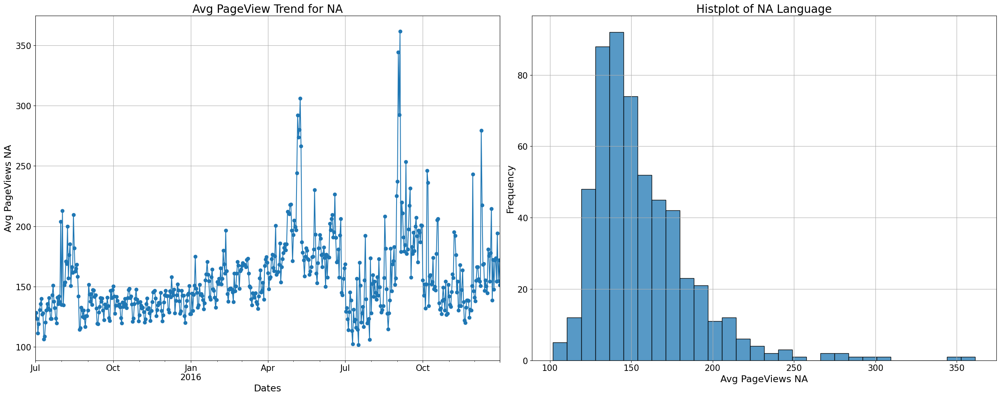

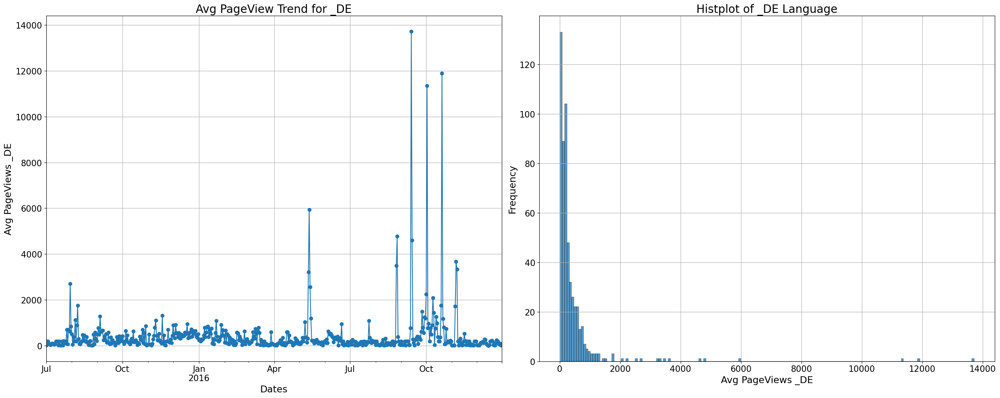

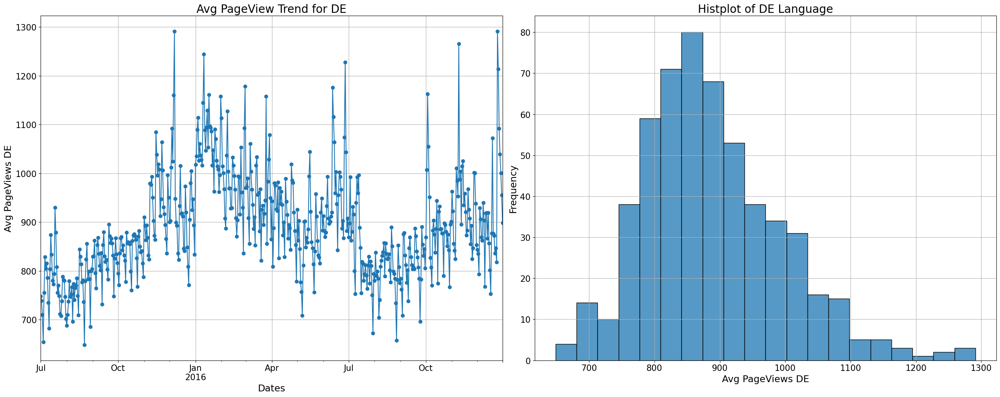

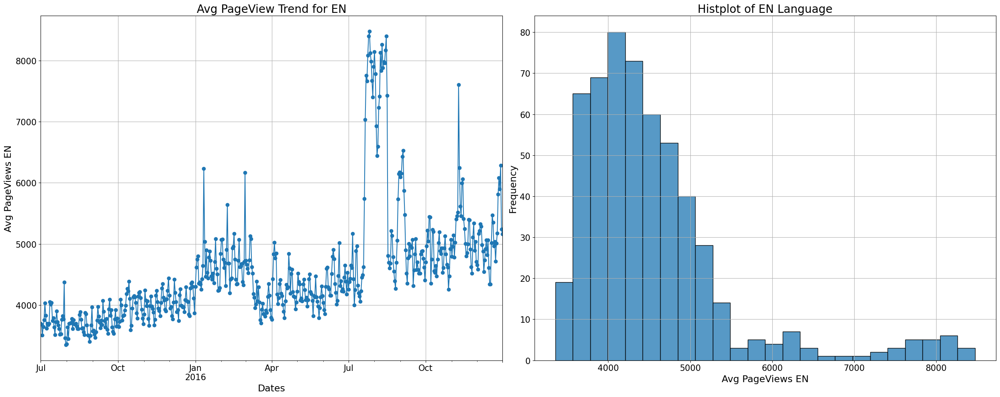

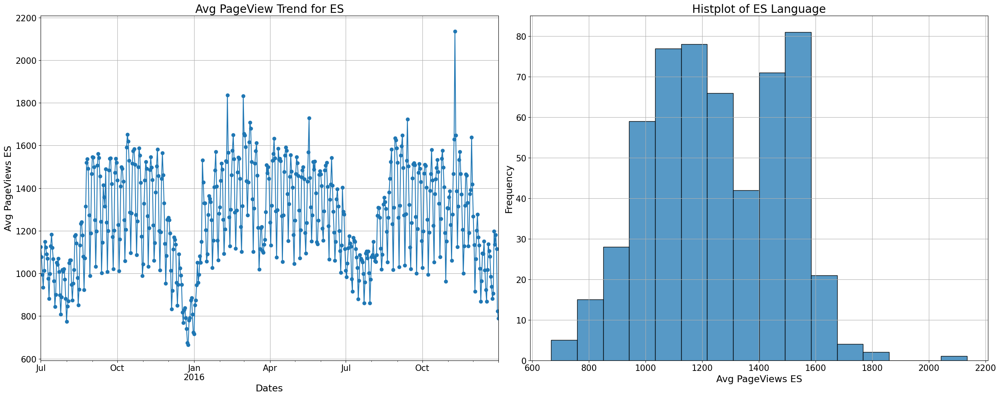

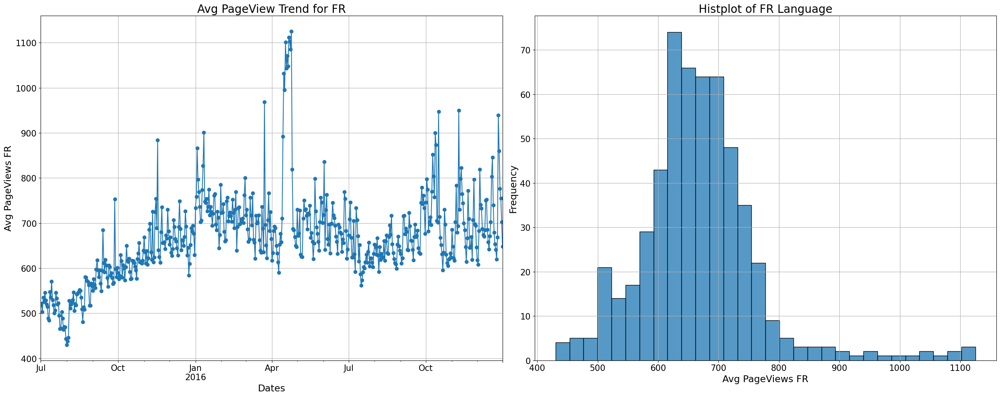

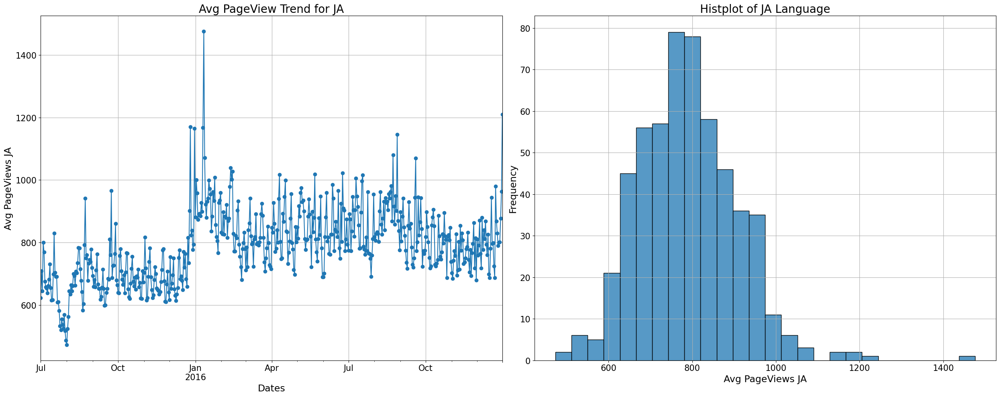

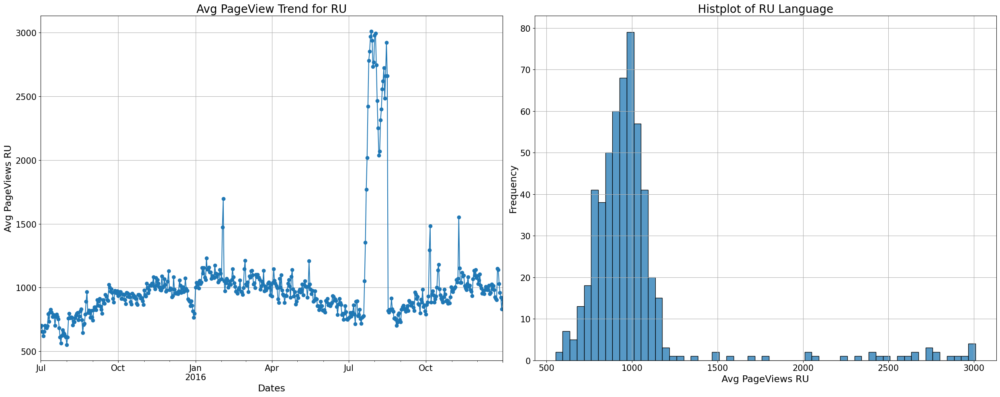

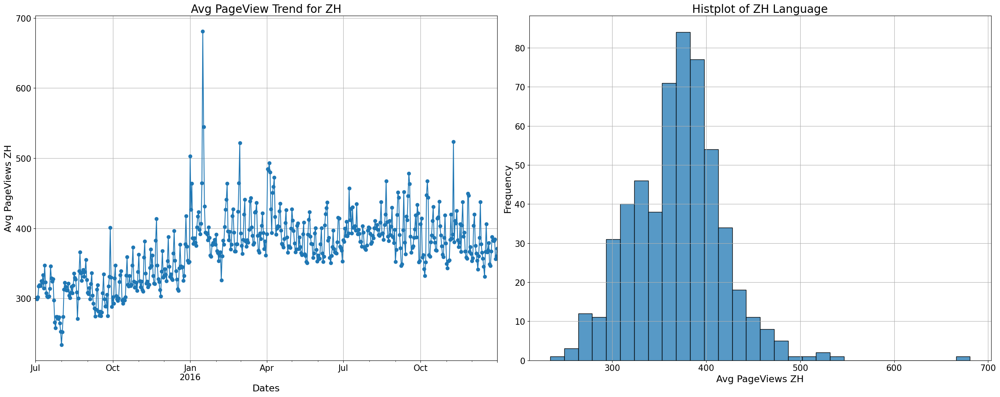

In [56]:
plot_trend_lines()

# Trend and Seasonality Check for Each Trends of PageViews

`Trend and Seasonality Check for Chinese(ZH) Language Pageviews`

In [57]:
model_zh = sm.tsa.seasonal_decompose(df.zh)

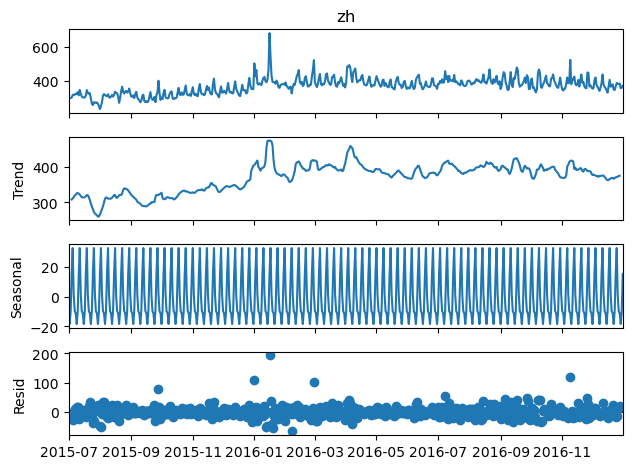

In [58]:
model_zh.plot()
plt.show()

In [59]:
def get_insight_plot(vals,window,ln):
    """
    This Function will print Original plot as well as Rolling Window plot
    """
    plt.figure(figsize=(25,10))
    vals.plot(style='-o',label='original')
    vals.rolling(window=window,center=False).mean().plot(style='-o',label='rolling')
    vals.rolling(window=window,center=True).mean().plot(style='-o',label='rolling center True')
    plt.xlabel('Dates',fontsize=17)
    plt.ylabel(f'Original Vs Windowed plot for {ln}',fontsize=17)
    plt.legend()
    plt.xticks(fontsize=15)  # Adjust fontsize as needed
    plt.yticks(fontsize=15)
    plt.grid()
    plt.title(f'Avg PageView Trend for {ln}',fontsize=20)
    plt.show()  
    print('\n')

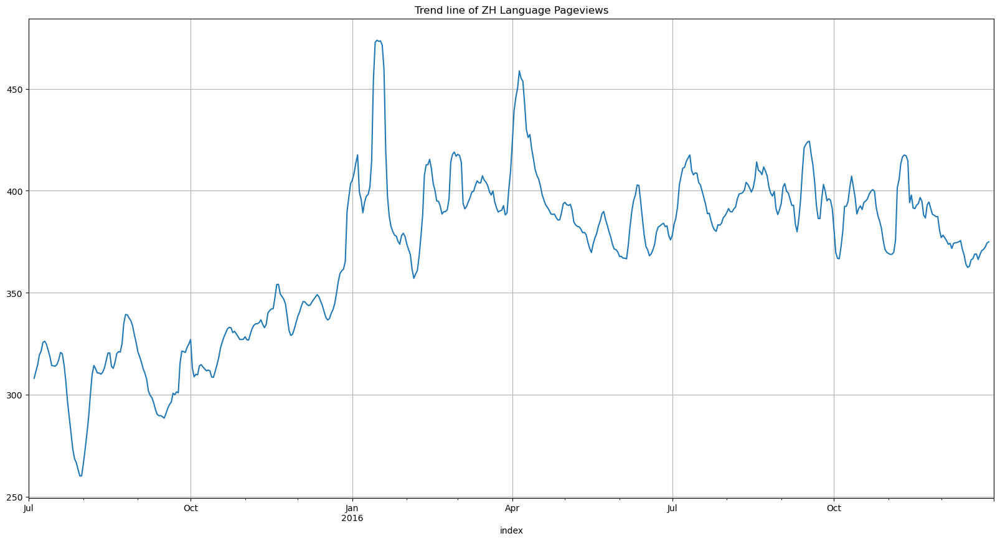

In [60]:
plt.title('Trend line of ZH Language Pageviews')
model_zh.trend.plot(grid=True,figsize=(20,10))
plt.show()

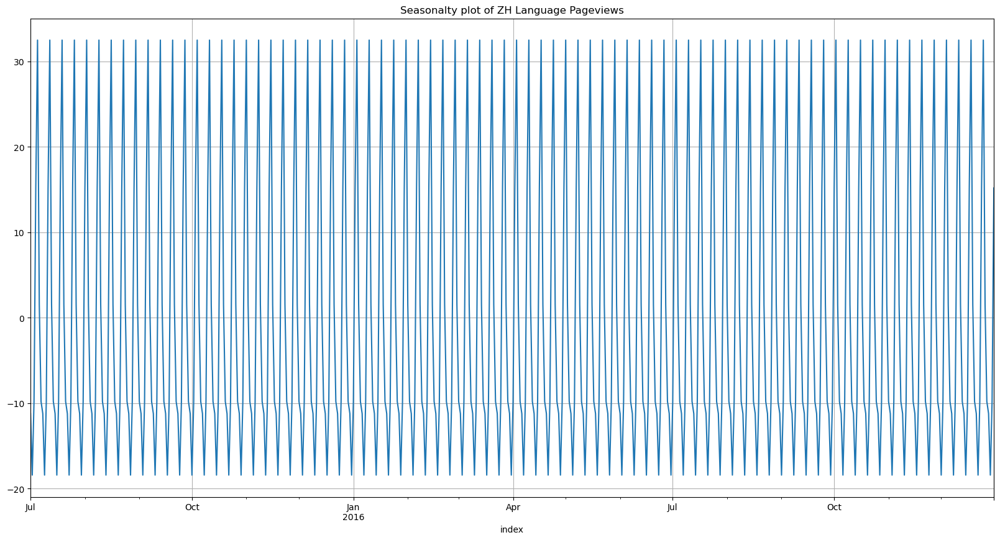

In [61]:
plt.title('Seasonalty plot of ZH Language Pageviews')
model_zh.seasonal.plot(grid=True,figsize=(20,10))
plt.show()

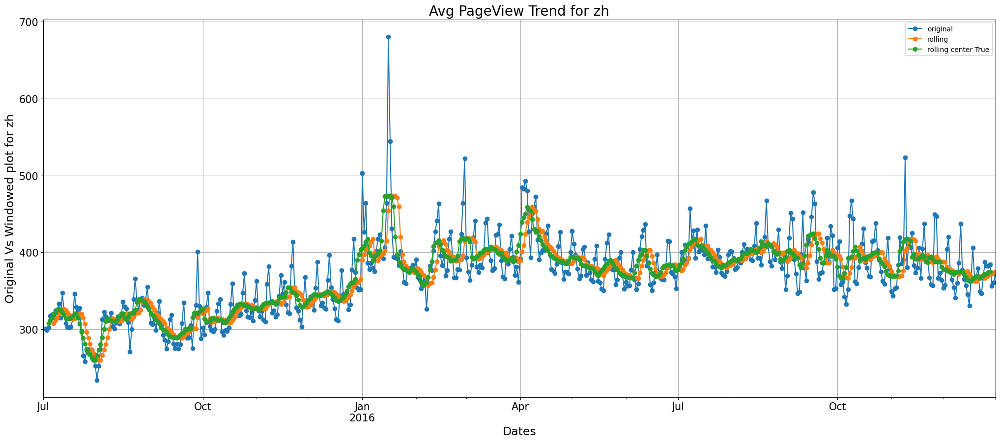

In [62]:
get_insight_plot(df['zh'],window=7,ln='zh')

# Observation 
1. Trend is showing upwards direction flow this indicates that with moving forward dates the view may increase.

2. Seasonality shows that it is repeating in every `8` months for this language.

`Trend and Seasonality Check for Russian(RU) Language Pageviews`

In [63]:
model_ru = sm.tsa.seasonal_decompose(df.ru)

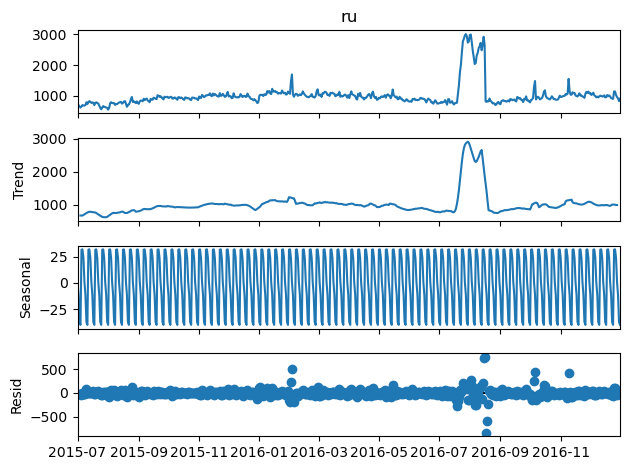

In [64]:
model_ru.plot()
plt.show()

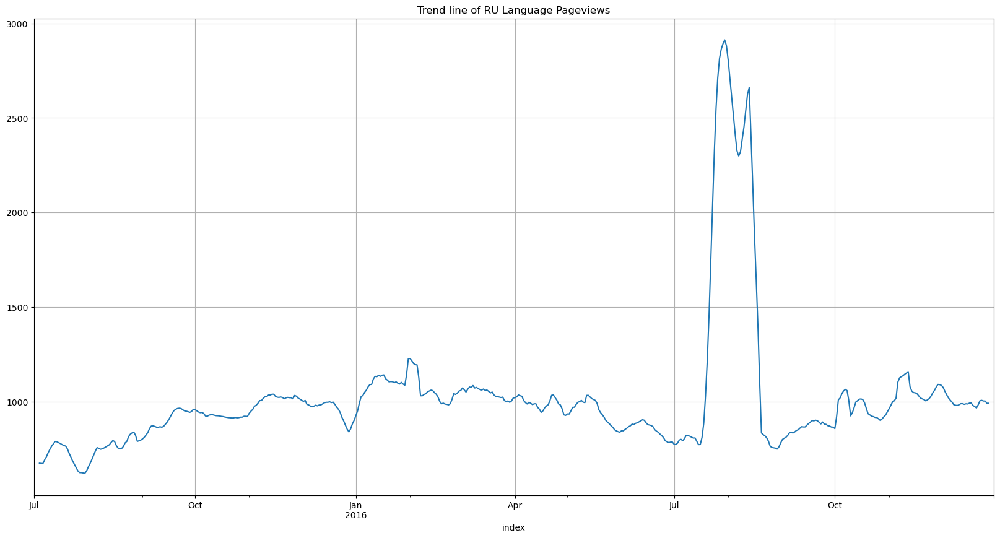

In [65]:
plt.title('Trend line of RU Language Pageviews')
model_ru.trend.plot(grid=True,figsize=(20,10))
plt.show()

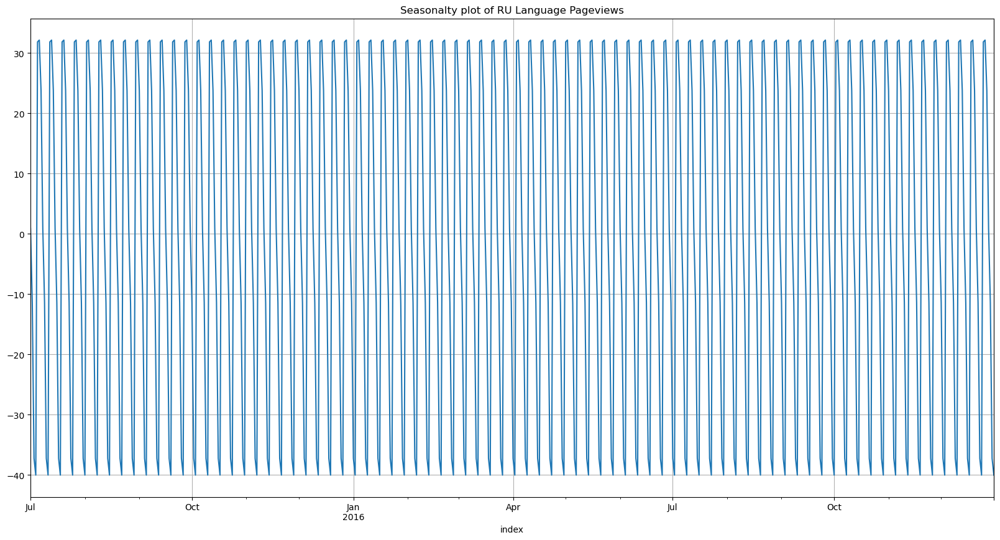

In [66]:
plt.title('Seasonalty plot of RU Language Pageviews')
model_ru.seasonal.plot(grid=True,figsize=(20,10))
plt.show()

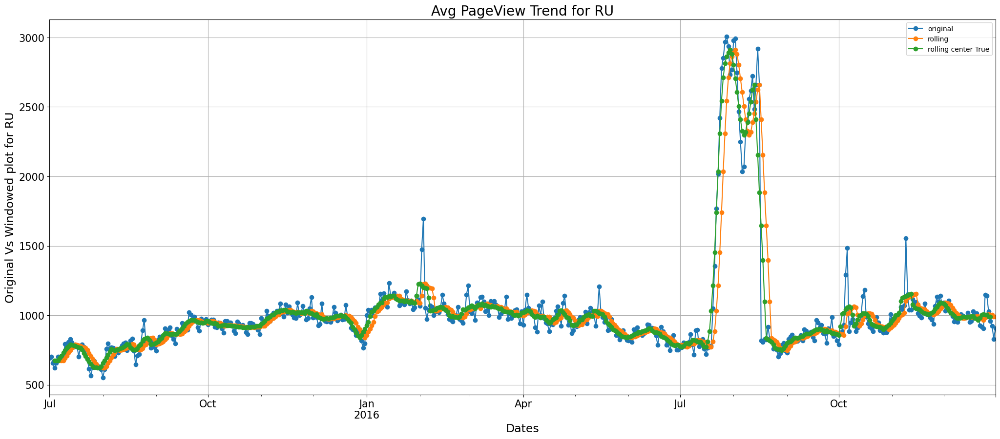

In [67]:
get_insight_plot(df['ru'],window=7,ln='RU')

# Observation
1. Trend is showing slightly downwards direction flow this indicates that with moving forward dates the pageviews may decrease.

2. Seasonality shows that it is repeating in every `8` months for this language.

`Trend and Seasonality Check for Japanese(JA) Language Pageviews`

In [68]:
model_ja = sm.tsa.seasonal_decompose(df.ja)

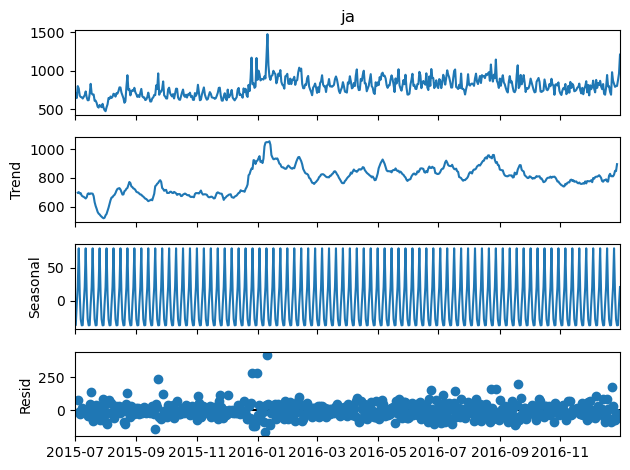

In [69]:
model_ja.plot()
plt.show()

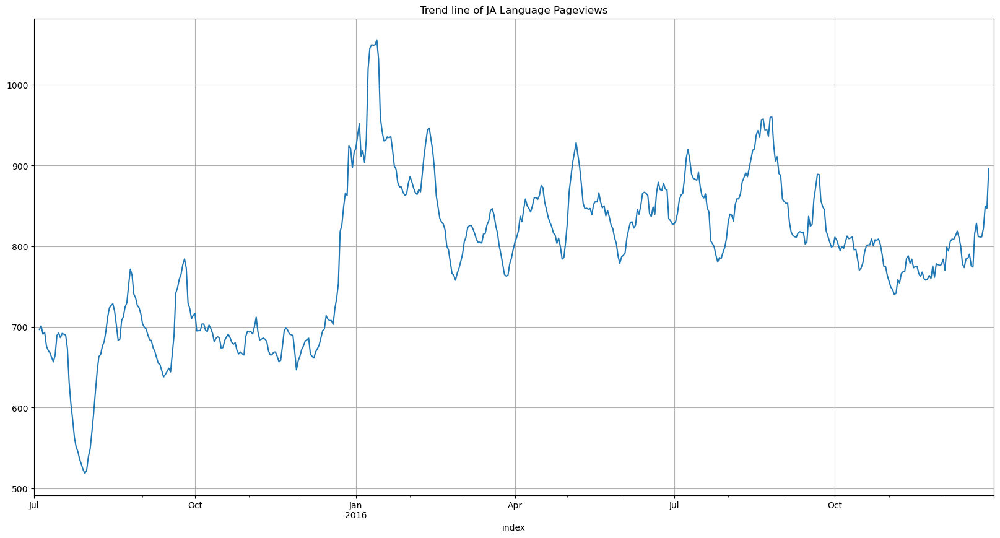

In [70]:
plt.title('Trend line of JA Language Pageviews')
model_ja.trend.plot(grid=True,figsize=(20,10))
plt.show()

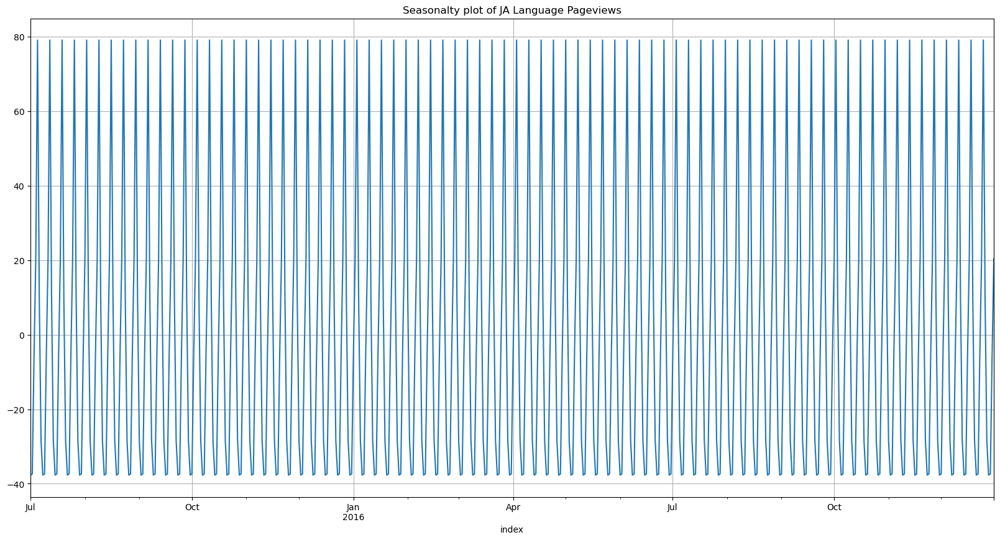

In [71]:
plt.title('Seasonalty plot of JA Language Pageviews')
model_ja.seasonal.plot(grid=True,figsize=(20,10))
plt.show()

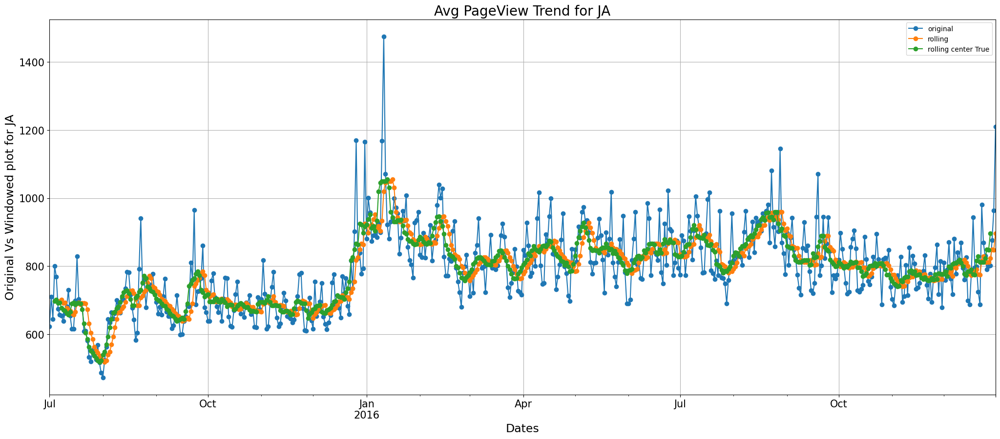

In [72]:
get_insight_plot(df['ja'],window=7,ln='JA')

# Observation
1. Trend is showing upwards direction flow this indicates that with moving forward dates the pageviews will increase.

2. Seasonality shows that it is repeating in every `8` months for this language.

`Trend and Seasonality Check for French(FR) Language Pageviews`

In [73]:
model_fr = sm.tsa.seasonal_decompose(df.fr)

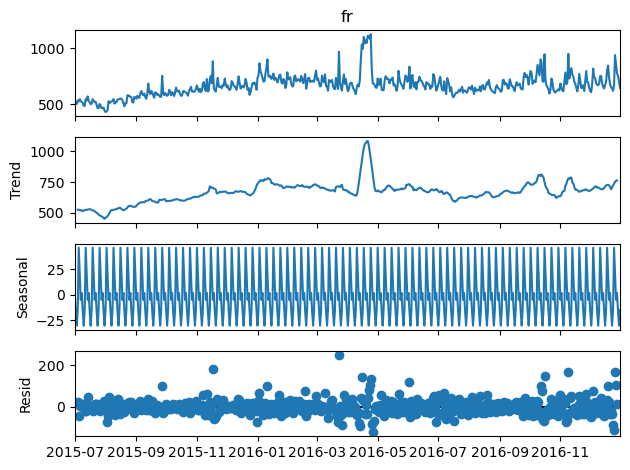

In [74]:
model_fr.plot()
plt.show()

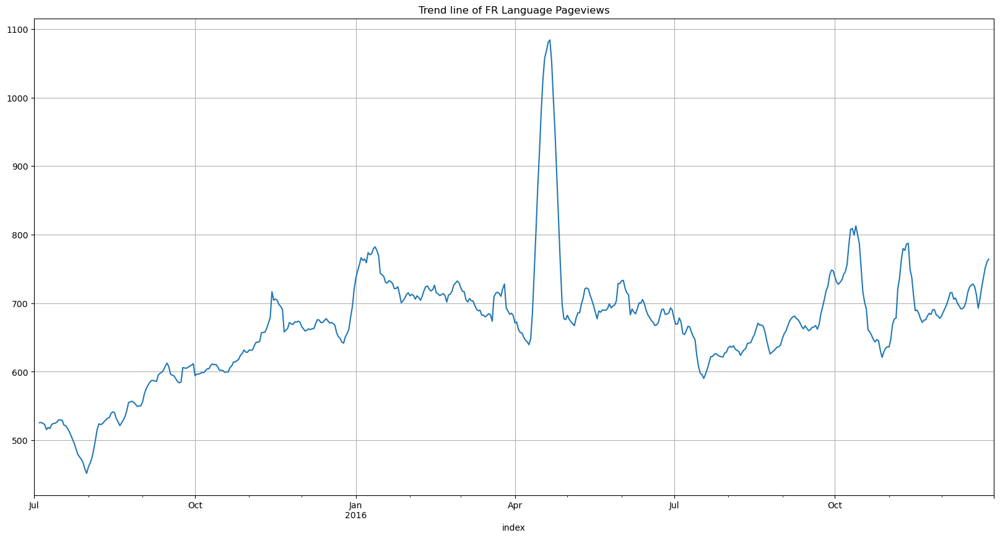

In [75]:
plt.title('Trend line of FR Language Pageviews')
model_fr.trend.plot(grid=True,figsize=(20,10))
plt.show()

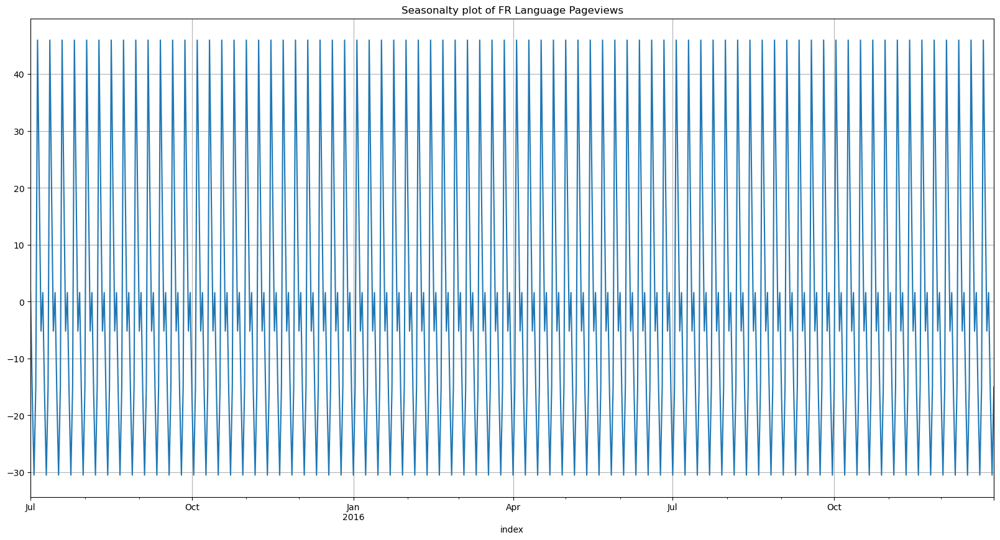

In [76]:
plt.title('Seasonalty plot of FR Language Pageviews')
model_fr.seasonal.plot(grid=True,figsize=(20,10))
plt.show()

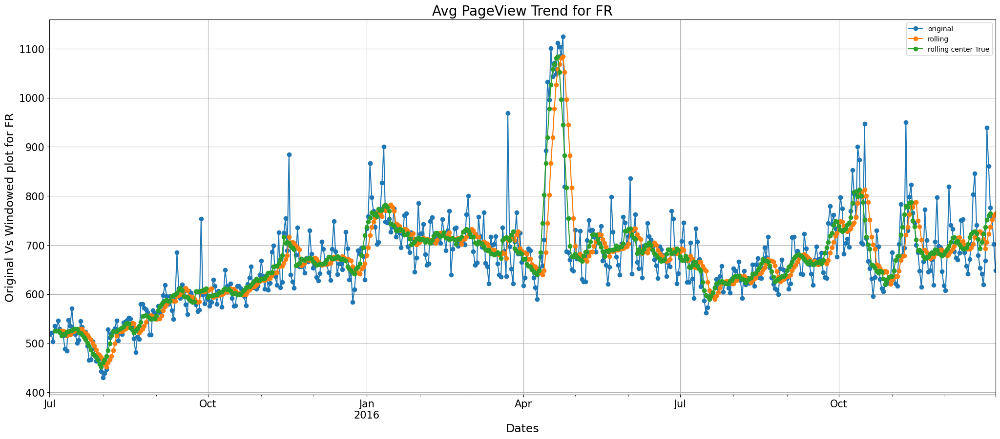

In [77]:
get_insight_plot(df['fr'],window=7,ln='FR')

# Observation
1. Trend is showing upward direction flow this indicates that with moving forward dates the pageviews may increase.

2. Seasonality shows that it is repeating in every `8` months for this language.

`Trend and Seasonality Check for Spanish(ES) Language Pageviews`

In [78]:
model_es = sm.tsa.seasonal_decompose(df.es)

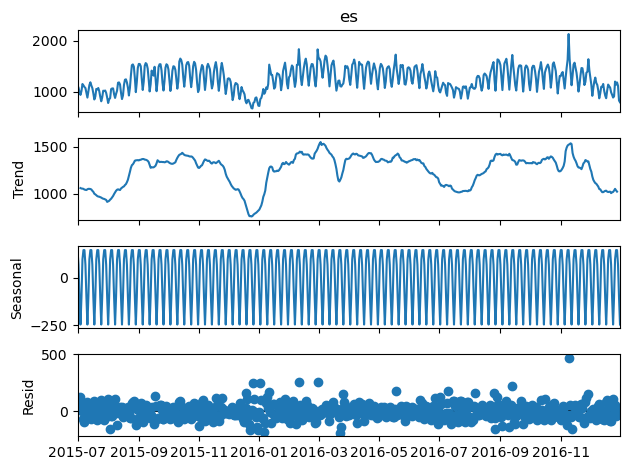

In [79]:
model_es.plot()
plt.show()

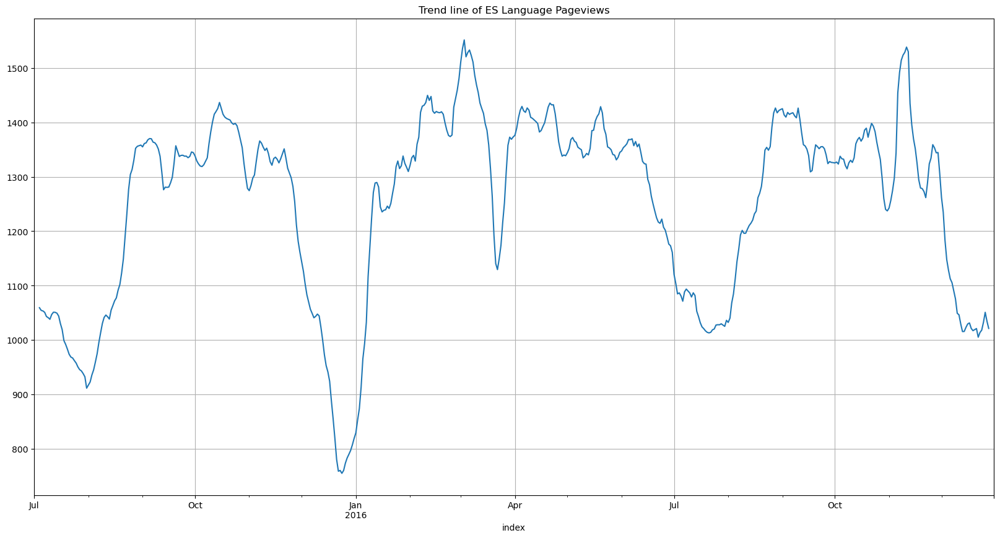

In [80]:
plt.title('Trend line of ES Language Pageviews')
model_es.trend.plot(grid=True,figsize=(20,10))
plt.show()

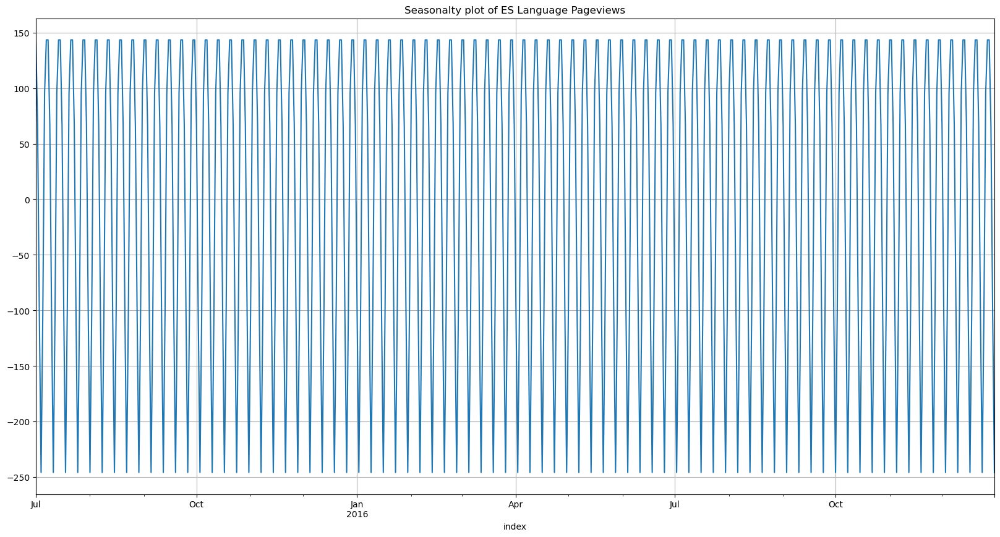

In [81]:
plt.title('Seasonalty plot of ES Language Pageviews')
model_es.seasonal.plot(grid=True,figsize=(20,10))
plt.show()

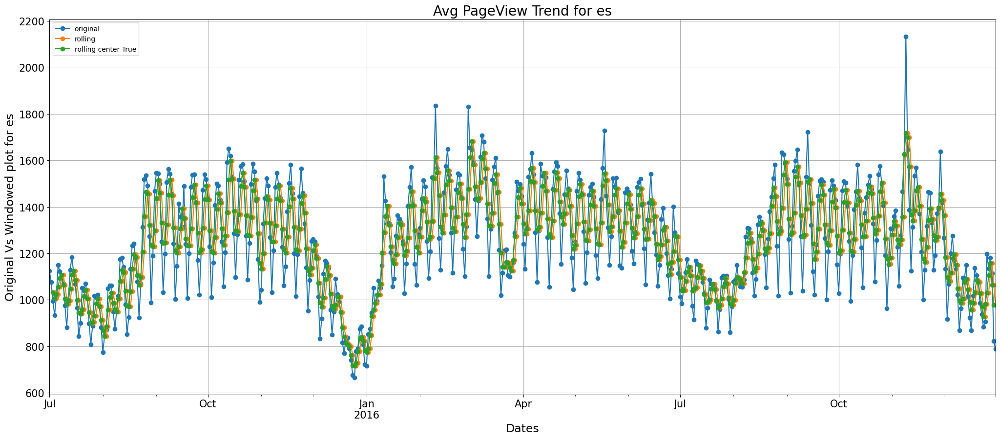

In [82]:
get_insight_plot(df['es'],window=4,ln='es')

# Observation
1. Trend is showing downward direction flow this indicates that with moving forward dates the pageviews may decrease.

2. Seasonality shows that it is repeating in every `7` months for this language.

`Trend and Seasonality Check for English(EN) Language Pageviews`

In [83]:
model_en = sm.tsa.seasonal_decompose(df.en)

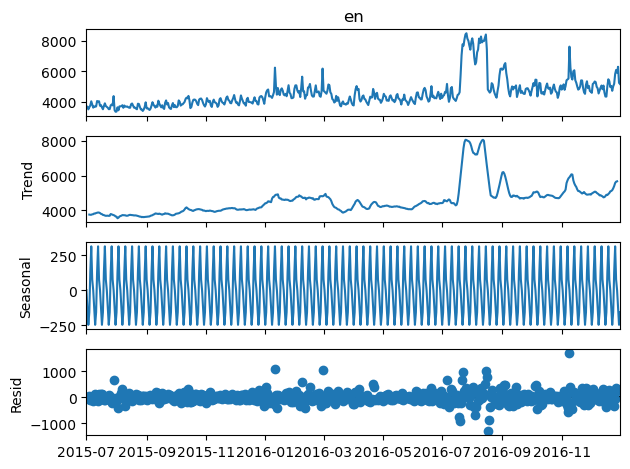

In [84]:
model_en.plot()
plt.show()

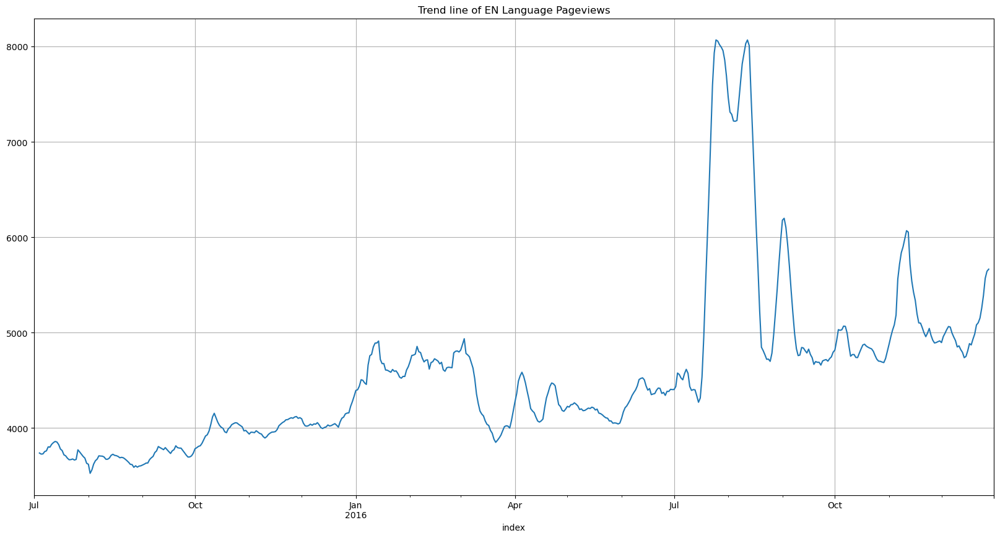

In [85]:
plt.title('Trend line of EN Language Pageviews')
model_en.trend.plot(grid=True,figsize=(20,10))
plt.show()

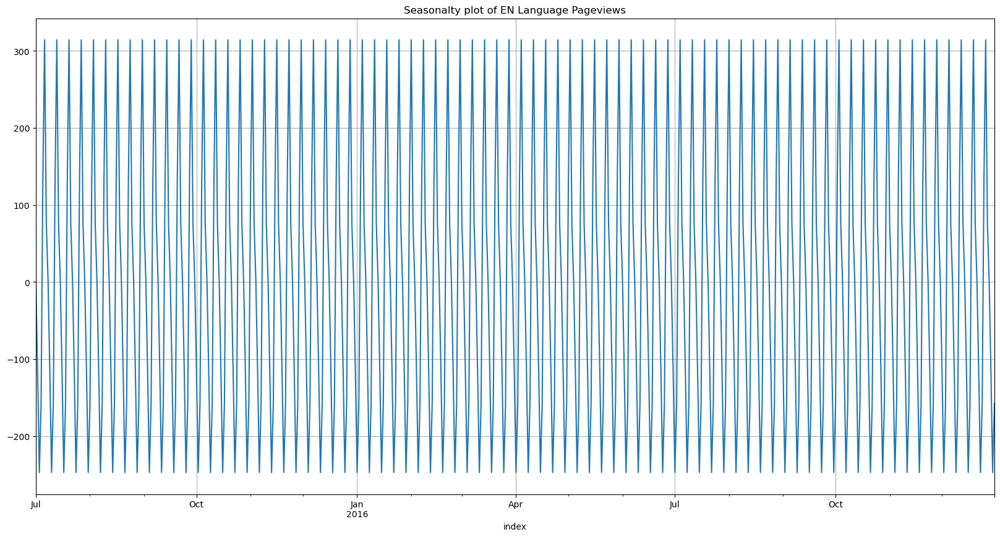

In [86]:
plt.title('Seasonalty plot of EN Language Pageviews')
model_en.seasonal.plot(grid=True,figsize=(20,10))
plt.show()

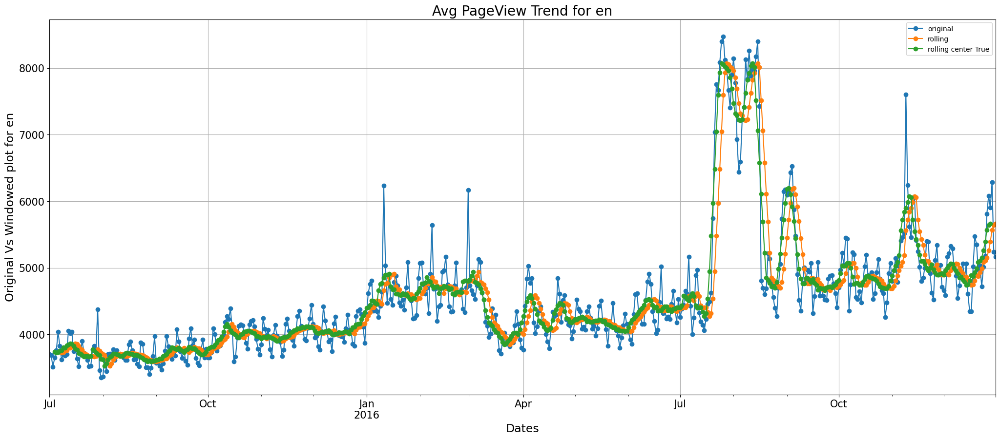

In [87]:
get_insight_plot(df['en'],window=7,ln='en')

# Observation
1. Trend is showing upward direction flow this indicates that with moving forward dates the pageviews may increase.

2. Seasonality shows that it is repeating in every `8` months for this language.

`Trend and Seasonality Check for German(DE) Language Pageviews`

In [88]:
model_de = sm.tsa.seasonal_decompose(df.de)

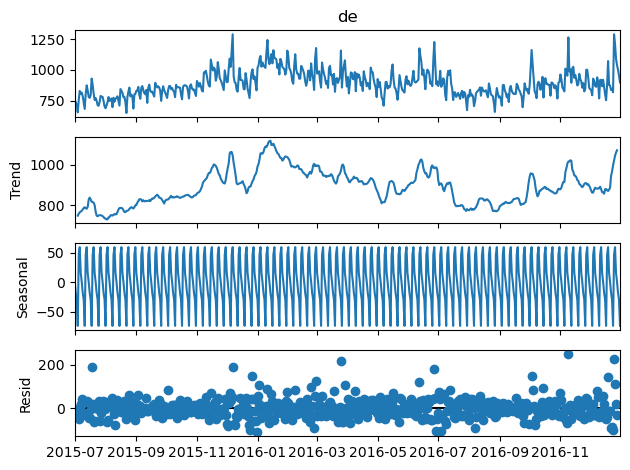

In [89]:
model_de.plot()
plt.show()

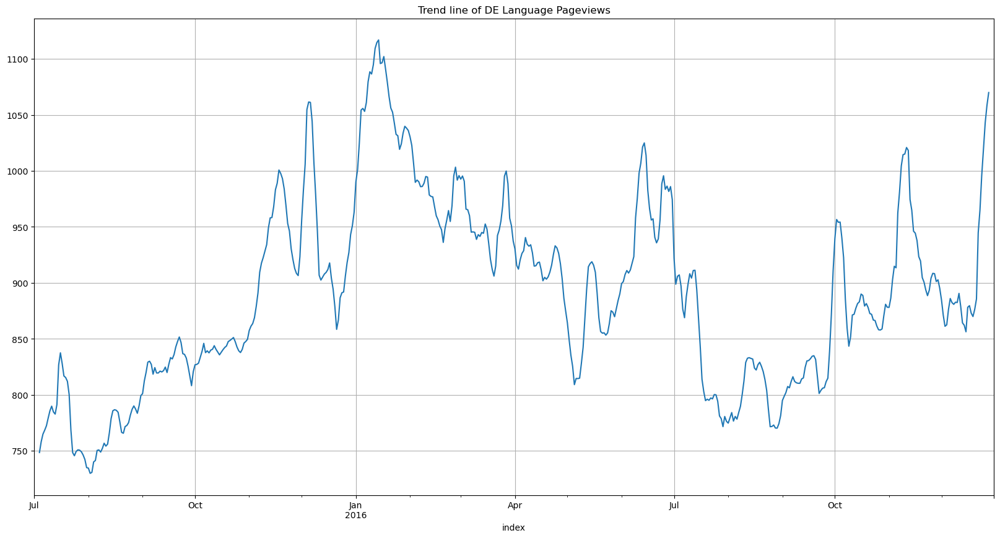

In [90]:
plt.title('Trend line of DE Language Pageviews')
model_de.trend.plot(grid=True,figsize=(20,10))
plt.show()

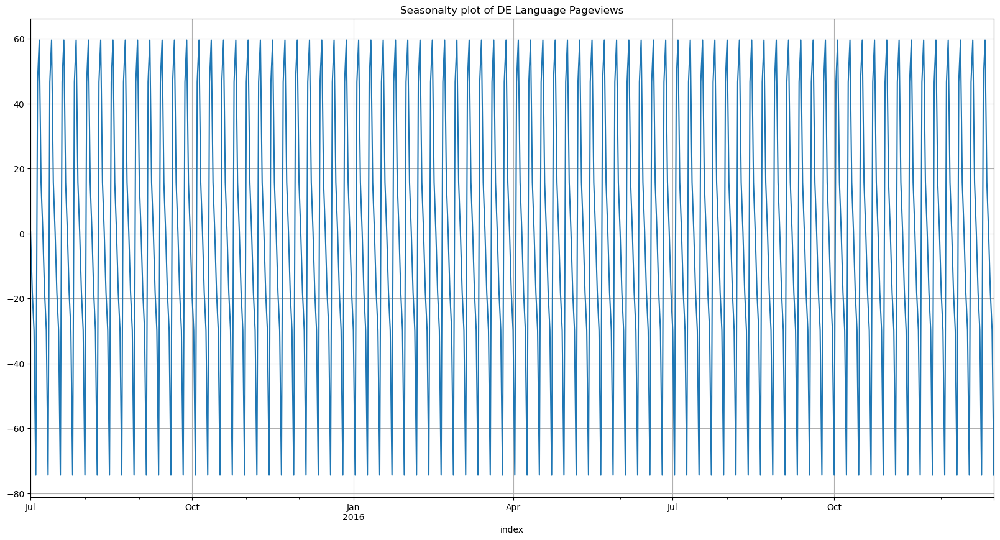

In [91]:
plt.title('Seasonalty plot of DE Language Pageviews')
model_de.seasonal.plot(grid=True,figsize=(20,10))
plt.show()

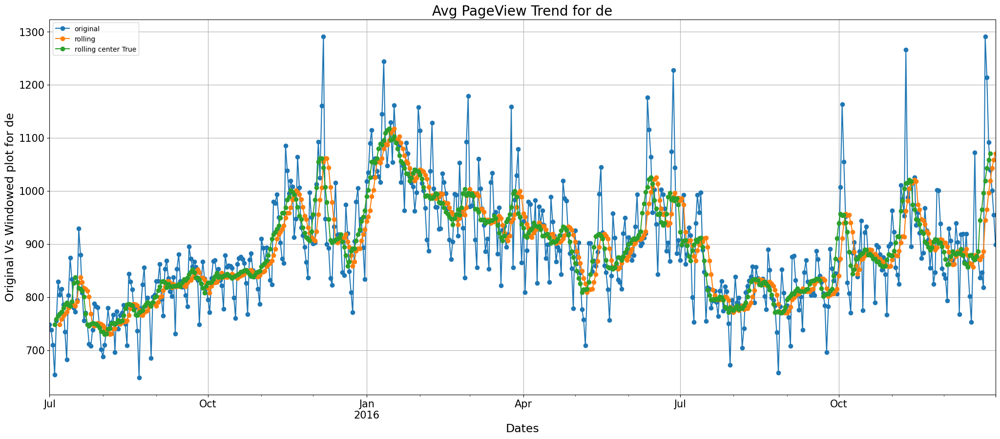

In [92]:
get_insight_plot(df['de'],window=7,ln='de')

# Observation
1. Trend is showing upward direction flow this indicates that with moving forward dates the pageviews may increase.

2. Seasonality shows that it is repeating in every `8` months for this language.

`Trend and Seasonality Check for German(_DE) Language Pageviews`

In [93]:
model__de = sm.tsa.seasonal_decompose(df._de)

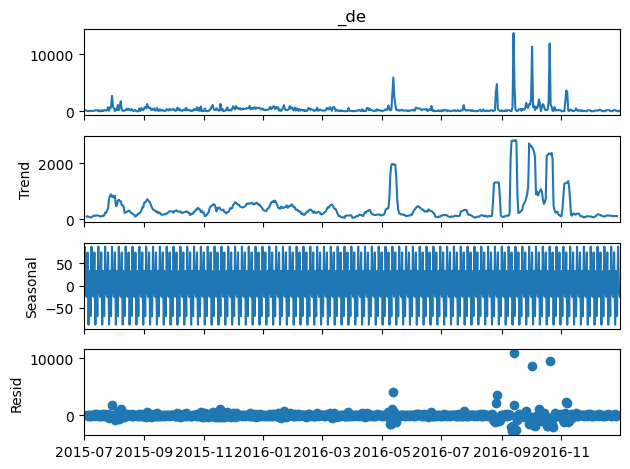

In [94]:
model__de.plot()
plt.show()

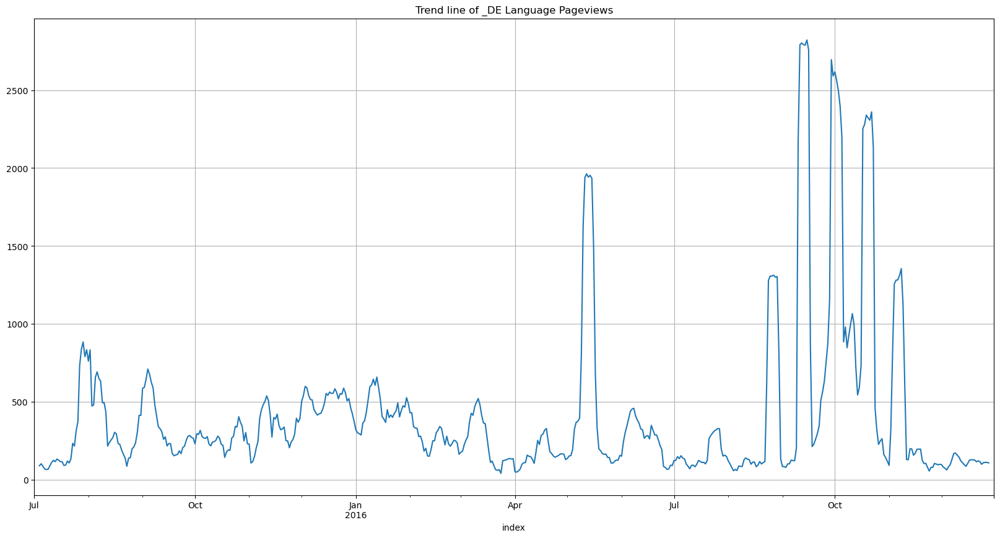

In [95]:
plt.title('Trend line of _DE Language Pageviews')
model__de.trend.plot(grid=True,figsize=(20,10))
plt.show()

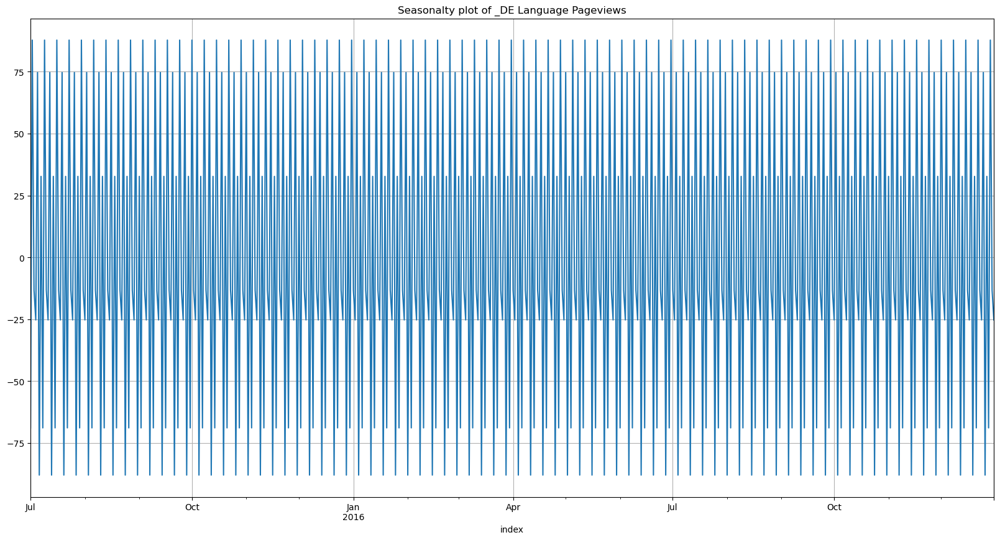

In [96]:
plt.title('Seasonalty plot of _DE Language Pageviews')
model__de.seasonal.plot(grid=True,figsize=(20,10))
plt.show()

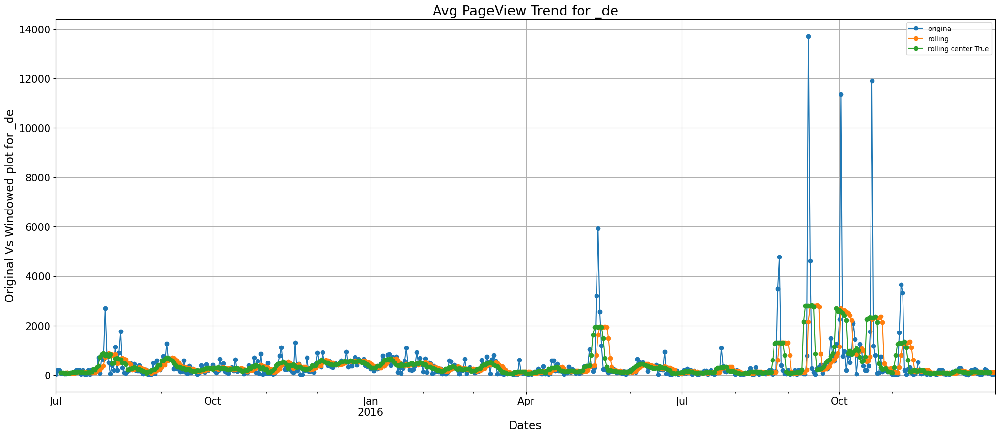

In [97]:
get_insight_plot(df['_de'],window=7,ln='_de')

# Observation
1. Trend is showing stationary flow this indicates that with moving forward dates the pageviews may be stationary in nature.

2. Seasonality shows that it is repeating in every `8` months for this language.

In [98]:
model_na = sm.tsa.seasonal_decompose(df.NA)

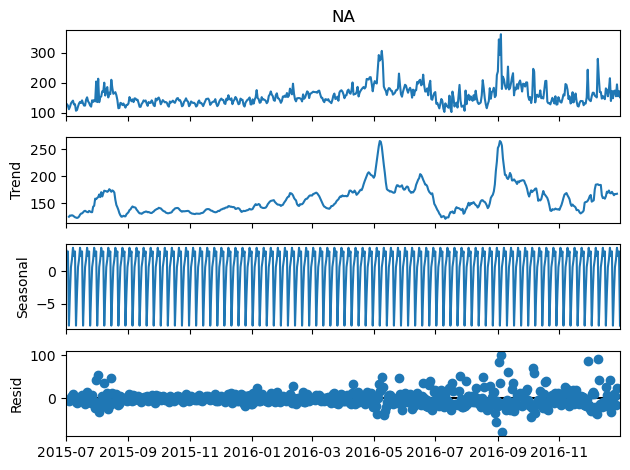

In [99]:
model_na.plot()
plt.show()

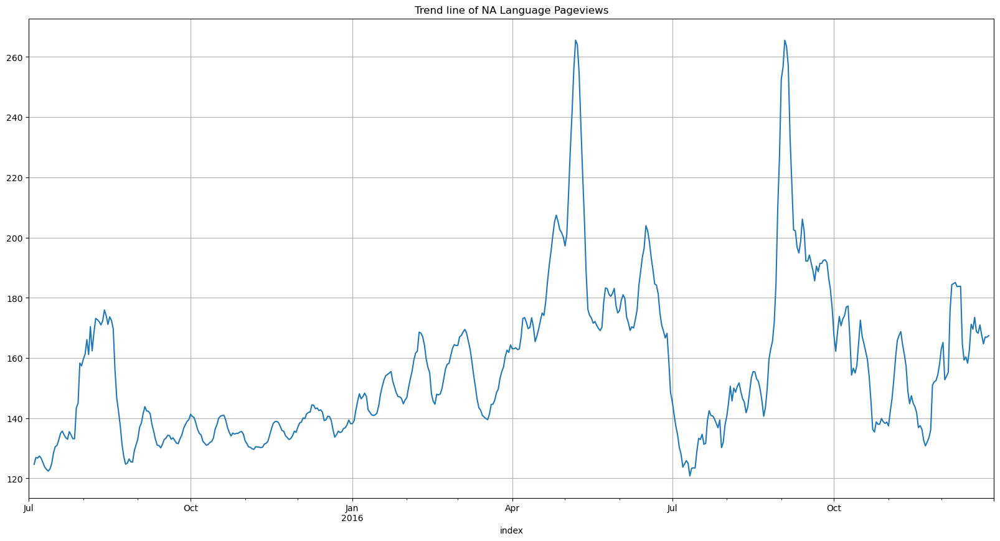

In [100]:
plt.title('Trend line of NA Language Pageviews')
model_na.trend.plot(grid=True,figsize=(20,10))
plt.show()

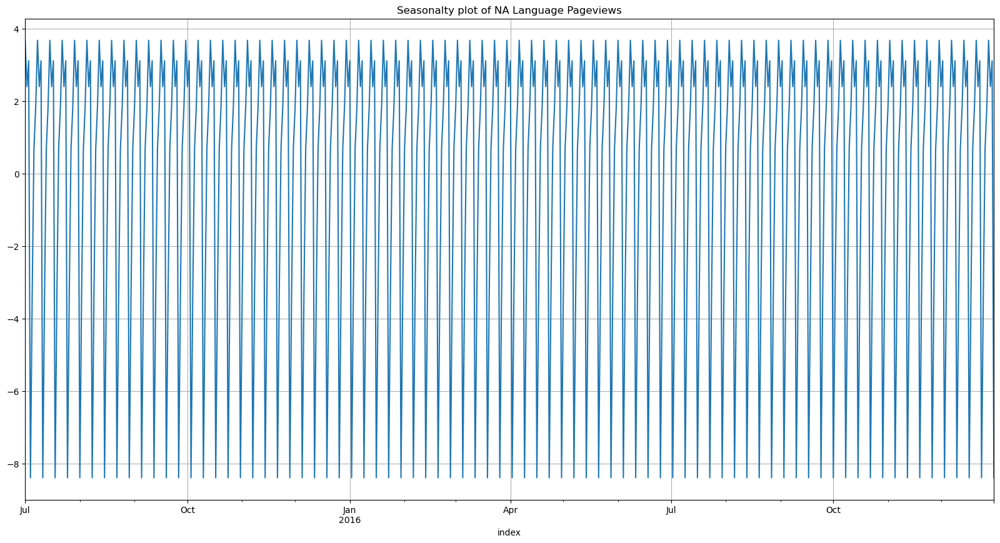

In [101]:
plt.title('Seasonalty plot of NA Language Pageviews')
model_na.seasonal.plot(grid=True,figsize=(20,10))
plt.show()

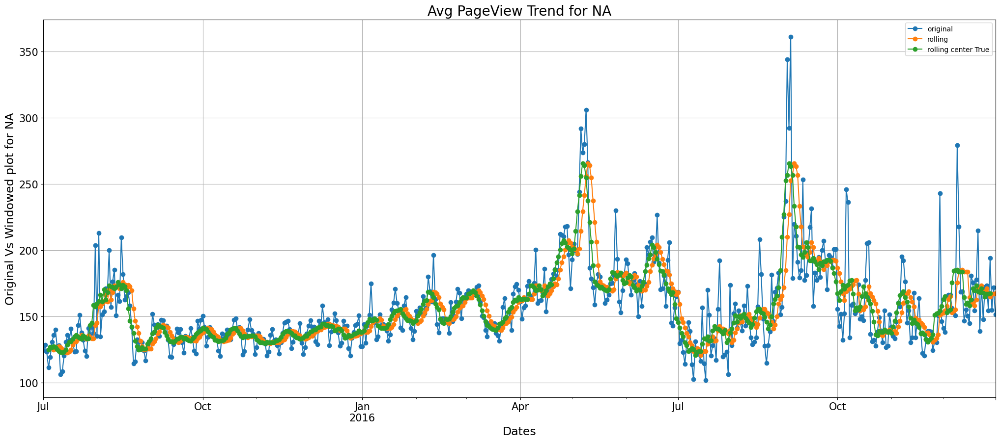

In [102]:
get_insight_plot(df['NA'],window=7,ln='NA')

# Observation
1. Trend is showing upward flow this indicates that with moving forward dates the pageviews may increase.

2. Seasonality shows that it is repeating in every `8` months for this language.

# Overall Observation from Above EDA Analysis

1. Whole Dataset has seasonality of 7 months.

2. Due to presence of outliers we can see spikes in trend, which we can fix either imputation or by clipping.

3. Following Language have shown below trend type 

    ZH - > High Trend

    RU -> Lower Trend

    JA -> High Trend

    FR -> High Trend

    ES -> Lower Trend

    EN -> High Trend

    DE -> High Trend

    _DE -> Lower Trend

    NA -> High Trend

# Stationarity Check For Data

In [103]:
# H0 : TS is non stationary 
# H1 : TS is stationary

def adf_test(data,sig_val=0.05):
    p_value = sm.tsa.stattools.adfuller(data)[1]
    #print(f'p-value : {p_value}')
    if(p_value <= sig_val):
        return('TS is stationary',p_value)
    else:
        return('TS is non stationary',p_value)

In [104]:
zh_res,_ = adf_test(df['zh'])
print(f'Stationary Status for ZH Language: {zh_res}')

ru_res,_ = adf_test(df['ru'])
print(f'Stationary Status for RU Language: {ru_res}')

ja_res,_ = adf_test(df['ja'])
print(f'Stationary Status for JA Language: {ja_res}')

fr_res,_ = adf_test(df['fr'])
print(f'Stationary Status for FR Language: {fr_res}')

es_res,_ = adf_test(df['es'])
print(f'Stationary Status for ES Language: {es_res}')

en_res,_ = adf_test(df['en'])
print(f'Stationary Status for EN Language: {en_res}')

de_res,_ = adf_test(df['de'])
print(f'Stationary Status for DE Language: {de_res}')

_de_res,_ = adf_test(df['_de'])
print(f'Stationary Status for _DE Language: {_de_res}')

NA_res,_ = adf_test(df['NA'])
print(f'Stationary Status for NA Language: {NA_res}')

Stationary Status for ZH Language: TS is non stationary
Stationary Status for RU Language: TS is stationary
Stationary Status for JA Language: TS is non stationary
Stationary Status for FR Language: TS is stationary
Stationary Status for ES Language: TS is stationary
Stationary Status for EN Language: TS is non stationary
Stationary Status for DE Language: TS is non stationary
Stationary Status for _DE Language: TS is non stationary
Stationary Status for NA Language: TS is stationary


# Observation
Below Mentioned Language trends are not stationary
1. ZH

2. JA

3. EN

4. DE

5. _DE

`Need to Perform Difference and de-trending to make it stationary.`

In [105]:
def plot_acfs(val,title):
    """
    This function will Autocorrelation plot for provided language code.
    """
    plot_acf(val,title=f'Autocorrelation of {title} Language')
    plt.show()

In [106]:
def get_detrended_deseasonal_data(val,title,m_val=None):
    detrended_val = val.diff()
    detrended_val.plot(title=f'Detrended Plot of {title} language')
    print(f'ADF Test after Detrending {title} language:{adf_test(detrended_val.dropna())}')
    plot_acfs(detrended_val.dropna(),title)
    return detrended_val
#     de_seasoned = detrended_val.diff(m_val).dropna()
#     plot_acfs(de_seasoned.dropna(),title=f'detrened & Deseasoned {title} language')
#     print(f'ADF Test after Deseasoned {title} Language:{adf_test(de_seasoned.dropna())}')
#     return de_seasoned

ADF Test after Detrending ZH language:('TS is stationary', 1.0822615719686195e-11)


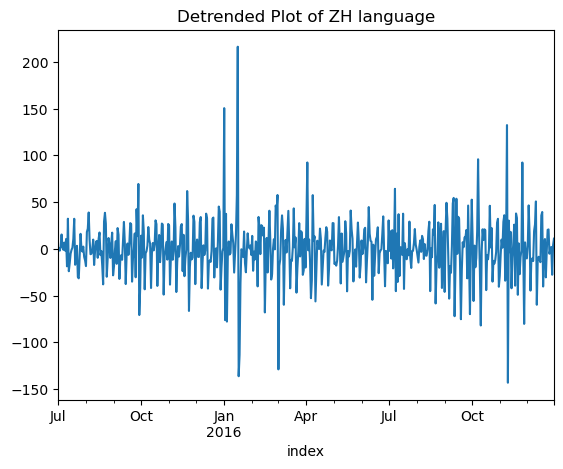

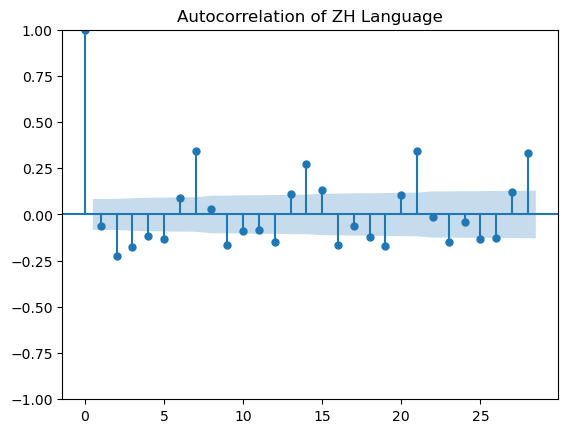

In [107]:
deTrended_ZH_lang = get_detrended_deseasonal_data(df['zh'],'ZH')

In [108]:
# ZH -> Peak at 7 ,14,21
# p -> 8 q-> 5

ADF Test after Detrending JA language:('TS is stationary', 5.950183790262341e-20)


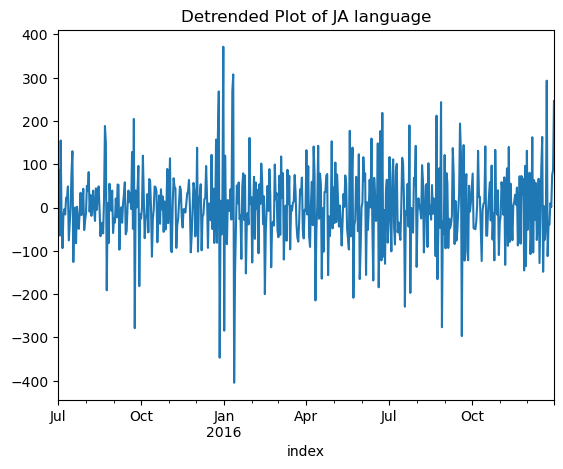

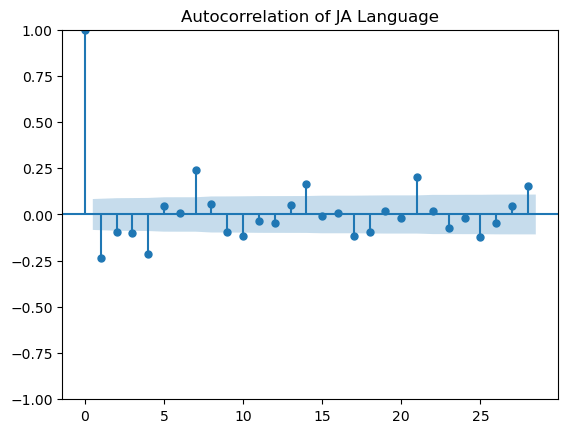

In [109]:
deTrended_JA_lang = get_detrended_deseasonal_data(df['ja'],'JA')

In [110]:
# JA -> Peak at 7 ,14,21
# P -> 6 Q -> 5

ADF Test after Detrending EN language:('TS is stationary', 5.292042536116286e-13)


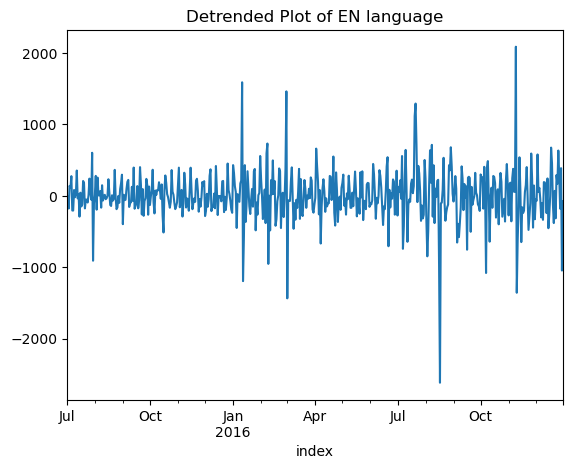

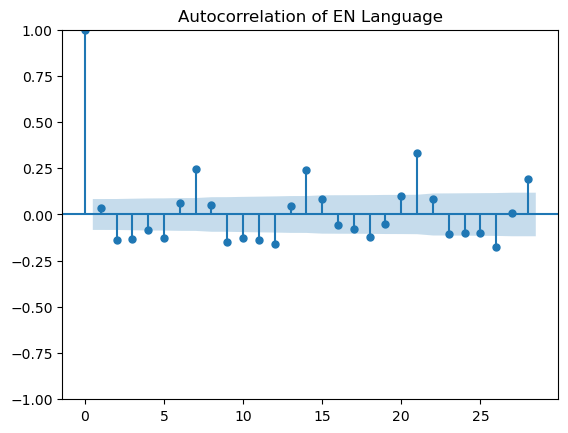

In [111]:
deTrended_EN_lang = get_detrended_deseasonal_data(df['en'],'EN')

In [112]:
# EN -> Peak at 7 ,14,21
# P -> 6 Q -> 5

ADF Test after Detrending DE language:('TS is stationary', 2.0718405278634737e-10)


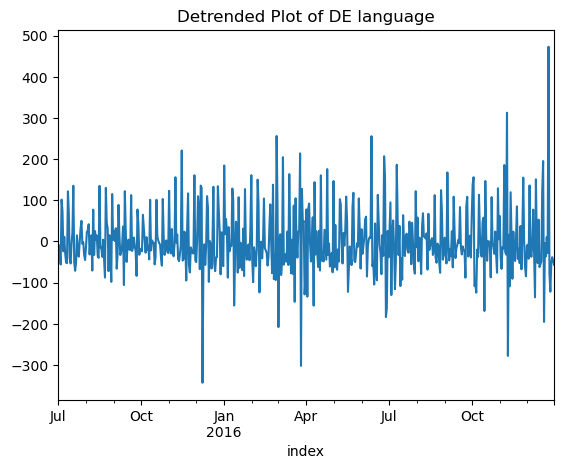

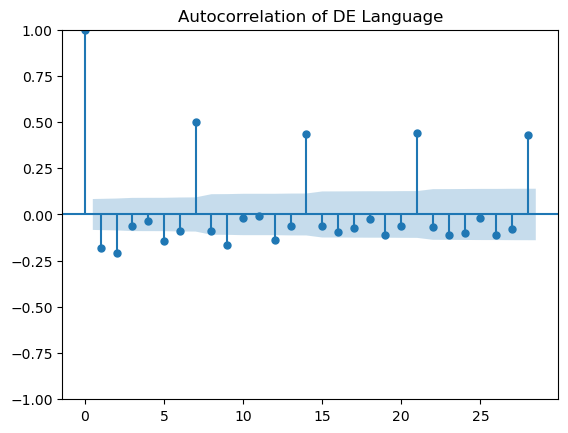

In [113]:
deTrended_DE_lang = get_detrended_deseasonal_data(df['de'],'DE')

In [114]:
# DE -> Peak at 7 ,14,21
# P -> 10 Q -> 5

ADF Test after Detrending _DE language:('TS is stationary', 1.5961380159824795e-20)


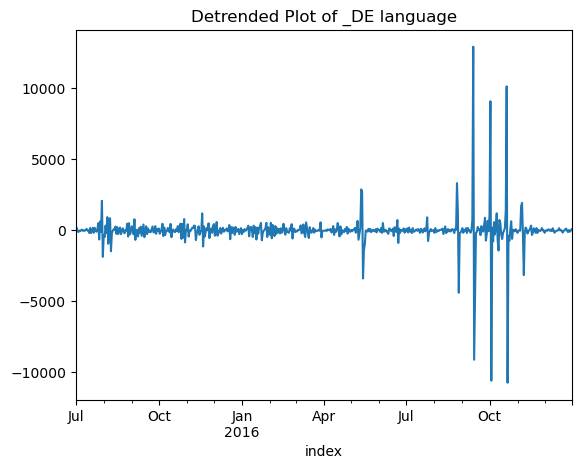

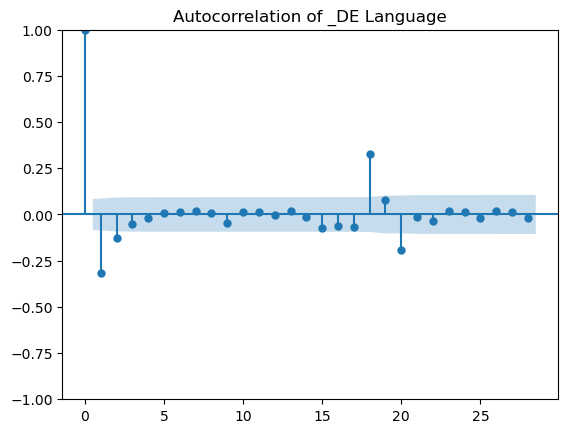

In [115]:
deTrended__DE_lang = get_detrended_deseasonal_data(df['_de'],'_DE')

In [116]:
# _DE -> Peak at 7 ,14,21
# P -> 6 Q -> 2

ADF Test after Detrending NA language:('TS is stationary', 6.074796247844382e-19)


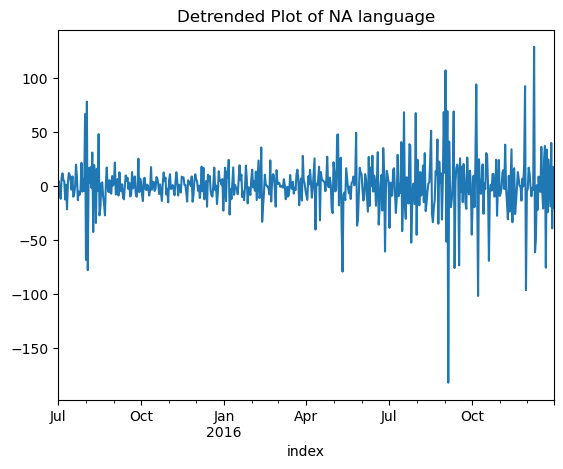

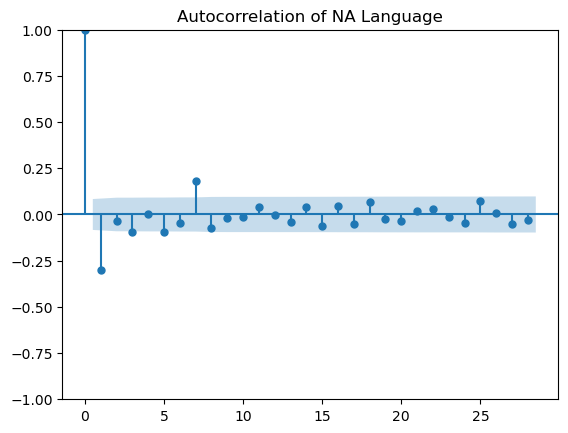

In [117]:
deTrended_NA_lang = get_detrended_deseasonal_data(df['NA'],'NA')

In [118]:
# NA -> Peak at 7 ,14,21
# P -> 5 Q -> 2

# Observation
It was observed that Seasonality of data is occuring in every `7` month.

# Training model for different languages Using ARIMA Model

In [119]:
df.head()

,NA,_de,de,en,es,fr,ja,ru,zh
index,,,,,,,,,
2015-07-01,124.284493,11.0,748.269078,3699.986672,1124.820419,518.275576,623.080703,691.852568,300.511928
2015-07-02,128.301077,192.0,738.514997,3688.549667,1076.750516,521.232645,709.462561,702.874850,300.816903
2015-07-03,123.393474,192.0,709.930981,3509.763578,993.822199,503.030516,644.695993,655.785690,298.917792
2015-07-04,111.330127,80.0,653.911157,3647.536381,934.806317,534.642391,799.631563,620.469613,301.842952
2015-07-05,119.047298,72.0,755.402831,3761.088692,1013.400292,525.623191,768.694764,656.572081,317.261095


In [120]:
df.shape

(550, 9)

In [121]:
zh_df = pd.DataFrame(df['zh'])
zh_train_x = zh_df.loc[zh_df.index < zh_df.index[-200]].copy()
zh_test_x = zh_df.loc[zh_df.index >= zh_df.index[-200]].copy()

In [122]:
zh_test_x.shape

(200, 1)

In [123]:
zh_train_x.head()

,zh
index,
2015-07-01,300.511928
2015-07-02,300.816903
2015-07-03,298.917792
2015-07-04,301.842952
2015-07-05,317.261095


In [124]:
def performance(actual, predicted):
    mape_value = mape(actual, predicted)
    print(f'MAPE :{round(mape_value,3)}')

C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


MAPE :0.048


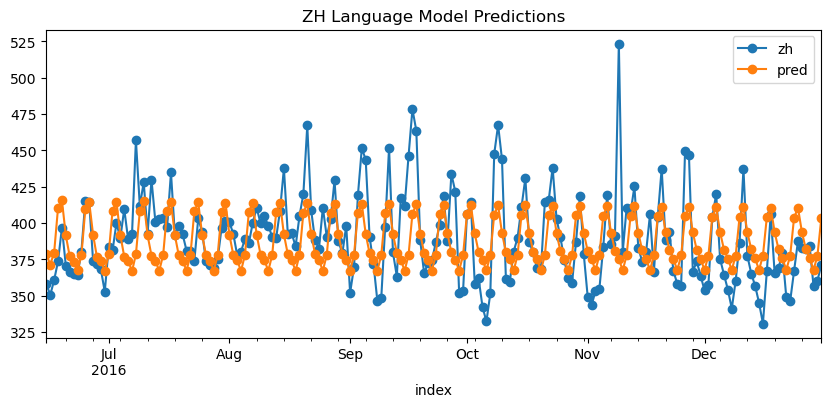

In [125]:
model = SARIMAX(zh_train_x['zh'],order=[8,1,8])
model = model.fit()
zh_test_x['pred'] = model.forecast(200)
zh_test_x.plot(style='-o',title='ZH Language Model Predictions',figsize=(10,4))
performance(zh_test_x['zh'],zh_test_x['pred'])

# Model for JA Language Code

In [126]:
ja_df = pd.DataFrame(df['ja'])
ja_train_x = ja_df.loc[ja_df.index < ja_df.index[-200]].copy()
ja_test_x = ja_df.loc[ja_df.index >= ja_df.index[-200]].copy()

In [127]:
ja_train_x.shape,ja_test_x.shape

((350, 1), (200, 1))

C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


MAPE :0.079


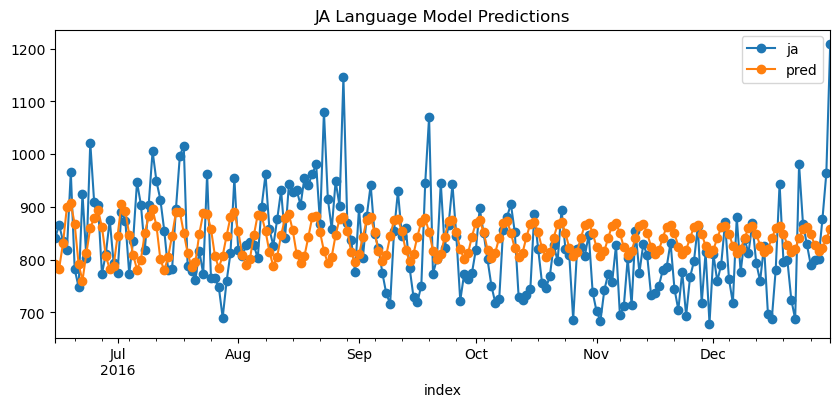

In [128]:
model = SARIMAX(ja_train_x,order=(8,1,8))
model = model.fit()
ja_test_x['pred'] = model.forecast(200)
ja_test_x.plot(style='-o',title='JA Language Model Predictions',figsize=(10,4))
performance(ja_test_x['ja'],ja_test_x['pred'])

# Model EN Language Code

In [129]:
en_df = pd.DataFrame(df['en'])
en_train_x = en_df.loc[en_df.index < en_df.index[-200]].copy()
en_test_x = en_df.loc[en_df.index >= en_df.index[-200]].copy()

C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


MAPE :0.133


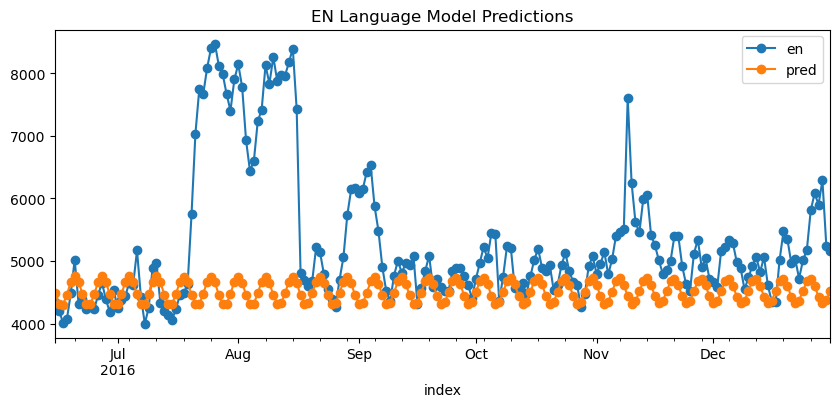

In [130]:
model = SARIMAX(en_train_x,order=(3,1,3))
model = model.fit()
en_test_x['pred'] = model.forecast(200)
en_test_x.plot(style='-o',title='EN Language Model Predictions',figsize=(10,4))
performance(en_test_x['en'],en_test_x['pred'])

# Model DE Language Code

In [131]:
de_df = pd.DataFrame(df['de'])
de_train_x = de_df.loc[de_df.index < de_df.index[-200]].copy()
de_test_x = de_df.loc[de_df.index >= de_df.index[-200]].copy()

C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


MAPE :0.145


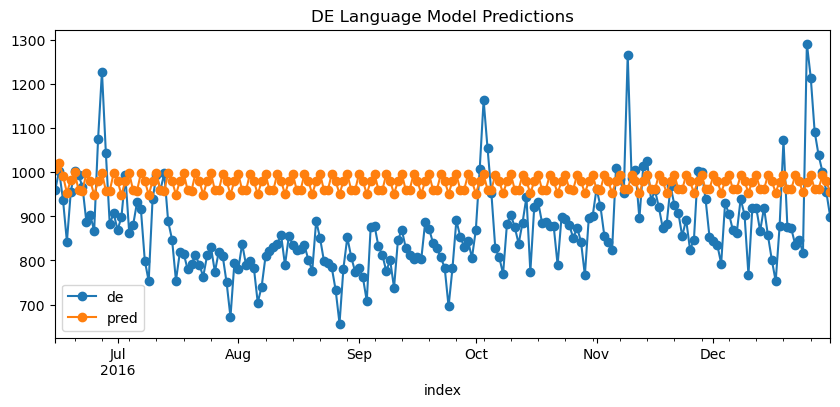

In [132]:
model = SARIMAX(de_train_x,order=(4,1,4))
model = model.fit()
de_test_x['pred'] = model.forecast(200)
de_test_x.plot(style='-o',title='DE Language Model Predictions',figsize=(10,4))
performance(de_test_x['de'],de_test_x['pred'])

# Model _DE Language Code

In [133]:
_de_df = pd.DataFrame(deTrended__DE_lang)
_de_train_x = _de_df.loc[_de_df.index < _de_df.index[-200]].copy()
_de_test_x  = _de_df.loc[_de_df.index >= _de_df.index[-200]].copy()

C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gaura\anaconda3\Lib\site-packages\pandas\plotting\_matplotlib\core.py:807: UserWarning: The label '_de' of <matplotlib.lin

MAPE :5787166219623565.0


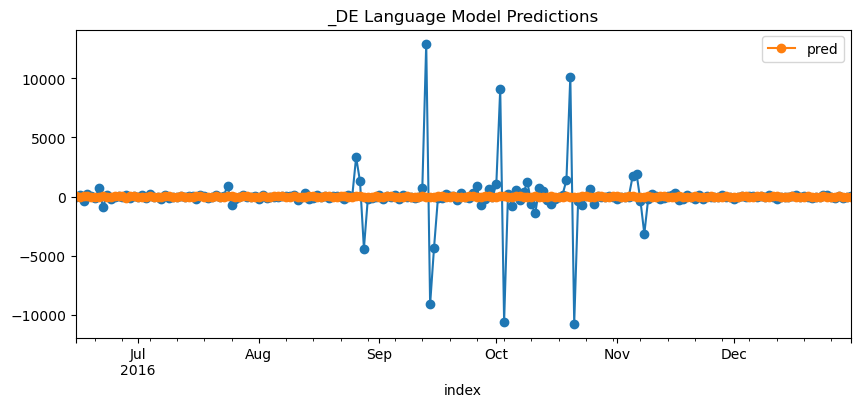

In [134]:
model = SARIMAX(_de_train_x,order=(8,1,8))
model = model.fit()
_de_test_x['pred'] = model.forecast(200)
_de_test_x.plot(style='-o',title='_DE Language Model Predictions',figsize=(10,4))
performance(_de_test_x['_de'],_de_test_x['pred'])

# Model RU Language Code

In [135]:
ru_df = pd.DataFrame(df['ru'])
ru_train_x = ru_df.loc[ru_df.index < ru_df.index[-200]].copy()
ru_test_x  = ru_df.loc[ru_df.index >= ru_df.index[-200]].copy()

C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Lik

MAPE :0.174


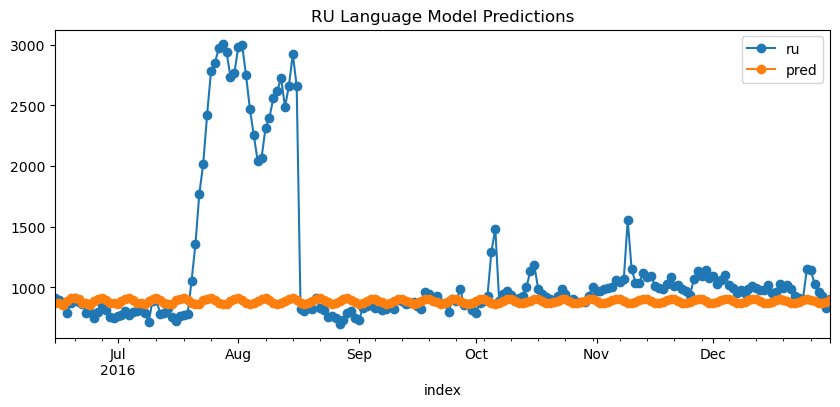

In [147]:
model = SARIMAX(ru_train_x,order=(7,1,7))
model = model.fit()
ru_test_x['pred'] = model.forecast(200)
ru_test_x.plot(style='-o',title='RU Language Model Predictions',figsize=(10,4))
performance(ru_test_x['ru'],ru_test_x['pred'])

In [137]:
NA_df = pd.DataFrame(df['NA'])
NA_train_x = NA_df.loc[NA_df.index < NA_df.index[-200]].copy()
NA_test_x  = NA_df.loc[NA_df.index >= NA_df.index[-200]].copy()

C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Lik

MAPE :0.238


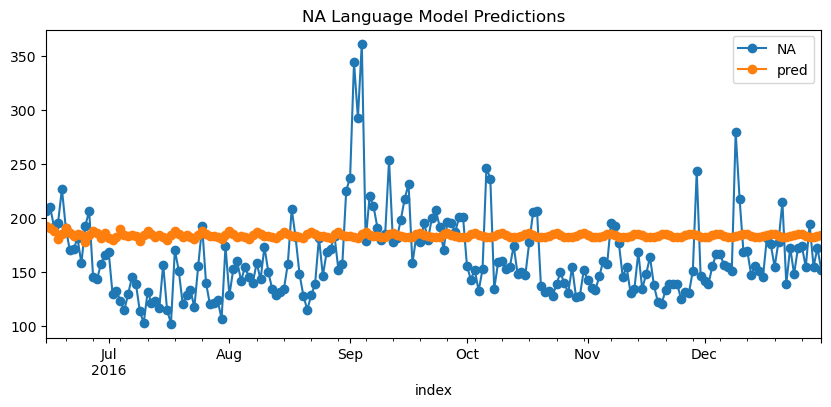

In [138]:
model = SARIMAX(NA_train_x,order=(7,1,7))
model = model.fit()
NA_test_x['pred'] = model.forecast(200)
NA_test_x.plot(style='-o',title='NA Language Model Predictions',figsize=(10,4))
performance(NA_test_x['NA'],NA_test_x['pred'])

# Training model for different languages Using SARIMAX Model

In [139]:
# Model for ZH Language Code

C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


MAPE :0.05


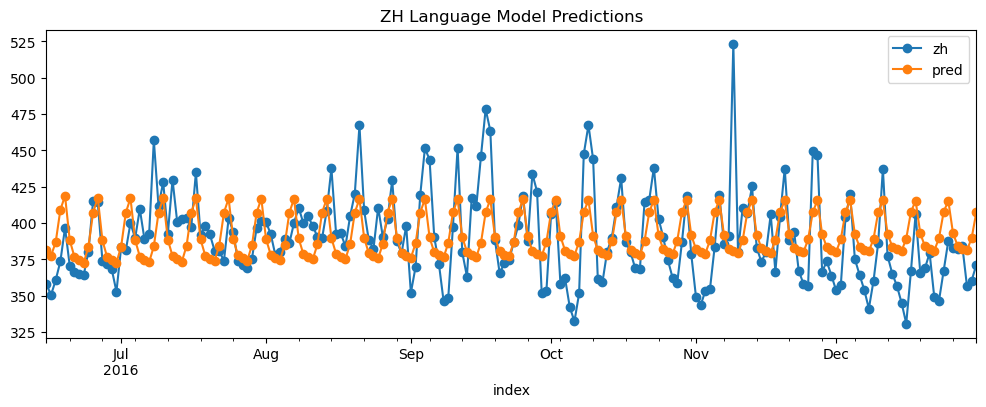

In [140]:
model = SARIMAX(zh_train_x['zh'],order=(2,1,1),seasonal_order=(2,0,1,7)) # (p,d,q) (P,D,Q,s)
model = model.fit()
zh_test_x['pred'] = model.forecast(200)
zh_test_x.plot(style='-o',title='ZH Language Model Predictions',figsize=(12,4))
performance(zh_test_x['zh'],zh_test_x['pred'])

In [141]:
# Model for JA Language Code

C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


MAPE :0.079


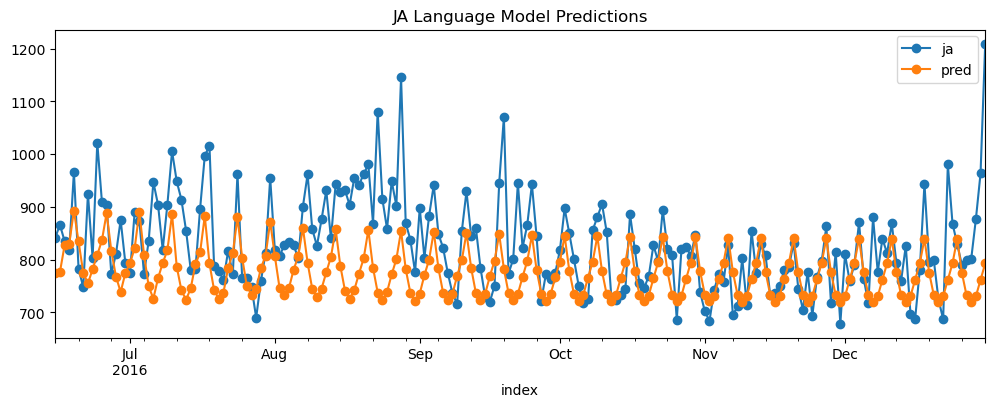

In [142]:
model = SARIMAX(ja_train_x['ja'],order=(2,0,0),seasonal_order=(7,1,1,7)) # (p,d,q) (P,D,Q,s)
model = model.fit()
ja_test_x['pred'] = model.forecast(200)
ja_test_x.plot(style='-o',title='JA Language Model Predictions',figsize=(12,4))
performance(ja_test_x['ja'],ja_test_x['pred'])

In [143]:
# Model for EN Language Code

C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Lik

MAPE :0.112


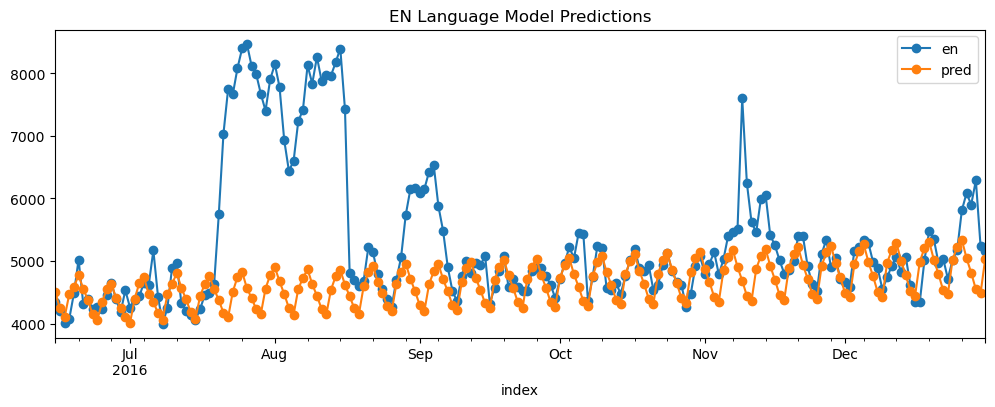

In [144]:
model = SARIMAX(en_train_x['en'],order=(2,0,3),seasonal_order=(7,2,1,7)) # (p,d,q) (P,D,Q,s)
model = model.fit()
en_test_x['pred'] = model.forecast(200)
en_test_x.plot(style='-o',title='EN Language Model Predictions',figsize=(12,4))
performance(en_test_x['en'],en_test_x['pred'])

In [148]:
# Model for DE Language Code

C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


MAPE :0.087


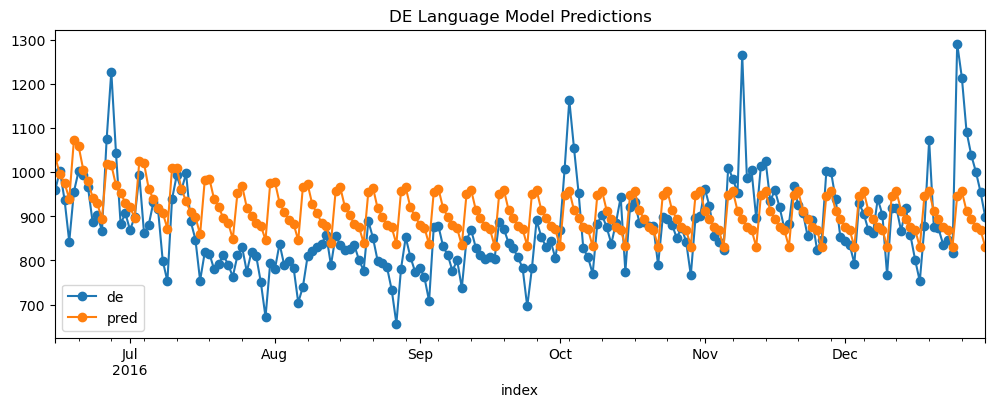

In [146]:
model = SARIMAX(de_train_x['de'],order=(3,0,0),seasonal_order=(7,1,1,7)) # (p,d,q) (P,D,Q,s)
model = model.fit()
de_test_x['pred'] = model.forecast(200)
de_test_x.plot(style='-o',title='DE Language Model Predictions',figsize=(12,4))
performance(de_test_x['de'],de_test_x['pred'])

In [151]:
# Model for _DE Language Code

C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\gaura\anaconda3\Lib\site-packages\pandas\plotting\_matplotlib\core.py:807: UserWarning: The label '_de' of <matplotlib.lines.Line2D object at 0x00000295E7C87550> starts with '_'. It is thus excluded from the legend.
  ax.legend(handles, labels, loc="best", title=title)


MAPE :7218950574980631.0


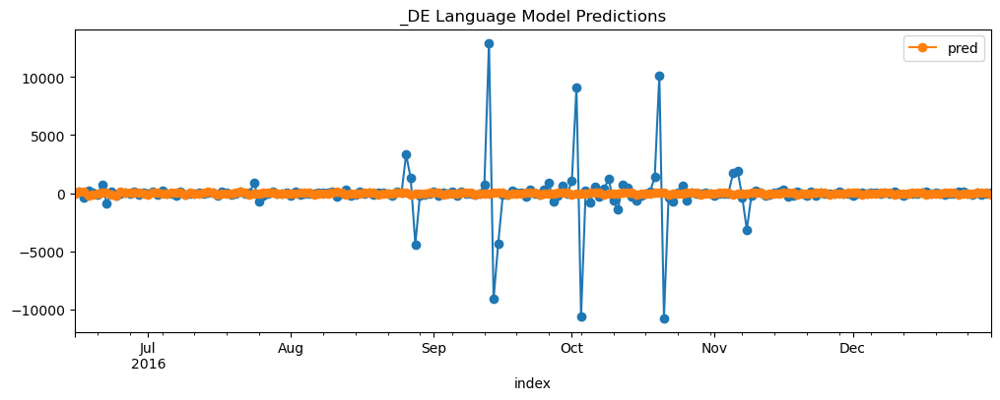

In [156]:
model = SARIMAX(_de_train_x['_de'],order=(3,0,0),seasonal_order=(7,1,1,7)) # (p,d,q) (P,D,Q,s)
model = model.fit()
_de_test_x['pred'] = model.forecast(200)
_de_test_x.plot(style='-o',title='_DE Language Model Predictions',figsize=(12,4))
performance(_de_test_x['_de'],_de_test_x['pred'])

In [157]:
# Model RU Language Code

C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Lik

MAPE :0.172


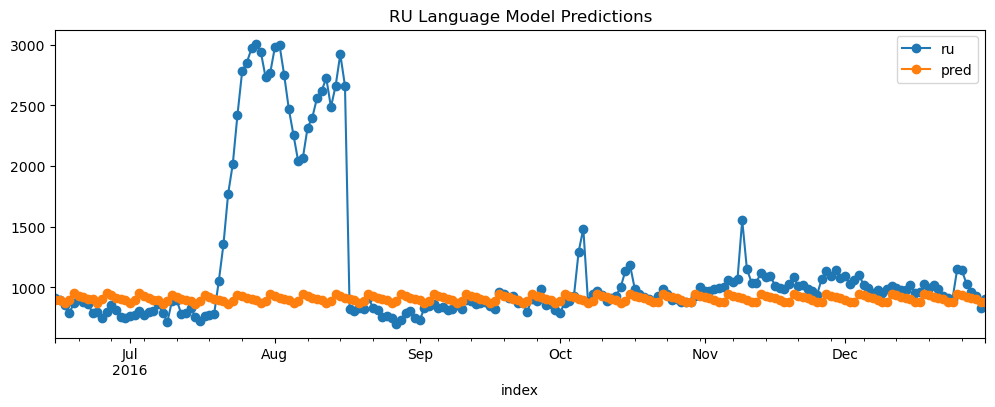

In [165]:
model = SARIMAX(ru_train_x['ru'],order=(2,0,1),seasonal_order=(7,1,1,7)) # (p,d,q) (P,D,Q,s)
model = model.fit()
ru_test_x['pred'] = model.forecast(200)
ru_test_x.plot(style='-o',title='RU Language Model Predictions',figsize=(12,4))
performance(ru_test_x['ru'],ru_test_x['pred'])

In [171]:
# Model NA Language Code

C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\gaura\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


MAPE :0.214


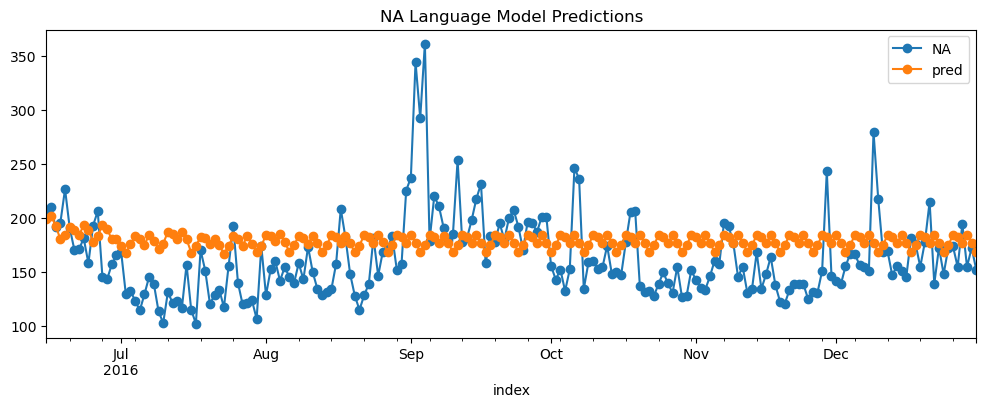

In [183]:
model = SARIMAX(NA_train_x['NA'],order=(2,0,0),seasonal_order=(7,1,3,7)) # (p,d,q) (P,D,Q,s)
model = model.fit()
NA_test_x['pred'] = model.forecast(200)
NA_test_x.plot(style='-o',title='NA Language Model Predictions',figsize=(12,4))
performance(NA_test_x['NA'],NA_test_x['pred'])

# Questions

1. Defining the problem statements and where can this and modifications of this be used?

Ans : The problem statement was all about getting the forecast of pageview for different language wikipedia page.
      This can be utilize to understand which language type page is prefered more depends on region.



2. Write 3 inferences you made from the data visualizations ?

Ans : Inference is as folows:
    
  1. Most prefered language is english as it was observed that avg pageview are more as compare to other languages.
  
  2. It was observed that there is significant decrease in pageviews for Spanish language in between January to March 2016.
    
  3. It was observed that there is significant Increase in pageviews for French language in between April to May 2016.
    
    
    
3. What does the decomposition of series do?

Ans: Decompositions of series will showcase below mentioned points.
    1. Trend
    2. Seasonality
    3. Residual

4. What level of differencing gave you a stationary series?

Ans : Level of differencing is contextual in this case it gave me staitionary series with just single differencing.

5. Difference between arima, sarima & sarimax.

Ans : The Basic difference between arima and Sarima is that arima does'nt take care of Seasonal part but Sarima takes care of it. The differnce between arima, sarima and Sarimax is both arima and sarima does'nt deal with external variable but sarimax does.
    

6. What other methods other than grid search would be suitable to get the model for all languages?

Ans: We can utilize iterative approach instead of grid search.